# Colour Bitmap Trials — CIELAB Generation

Generate color-oddball bitmaps using the `colour-science` library for CIELAB colour space operations.

**Kernel:** Python (colour-lab)

In [1]:
import numpy as np
import colour
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline

print(f"colour-science {colour.__version__}")
print(f"numpy {np.__version__}")

colour-science 0.4.7
numpy 2.4.3


## Quick Reference: colour-science CIELAB conversions

```python
# sRGB [0,1] → CIE XYZ → CIELAB
XYZ = colour.sRGB_to_XYZ(rgb)          # rgb shape (3,) or (N,3)
Lab = colour.XYZ_to_Lab(XYZ)            # D65 illuminant by default

# CIELAB → CIE XYZ → sRGB
XYZ = colour.Lab_to_XYZ(Lab)
rgb = colour.XYZ_to_sRGB(XYZ)           # may need clipping to [0,1]

# CIELAB → CIELCHab (cylindrical: L*, C*, h°)
LCH = colour.Lab_to_LCHab(Lab)
Lab = colour.LCHab_to_Lab(LCH)
```

In [2]:
# Smoke test: round-trip sRGB → CIELAB → sRGB
test_rgb = np.array([0.8, 0.2, 0.3])
XYZ = colour.sRGB_to_XYZ(test_rgb)
Lab = colour.XYZ_to_Lab(XYZ)
LCH = colour.Lab_to_LCHab(Lab)

print(f"sRGB:    {test_rgb}")
print(f"CIELAB:  L*={Lab[0]:.2f}, a*={Lab[1]:.2f}, b*={Lab[2]:.2f}")
print(f"CIELCHab: L*={LCH[0]:.2f}, C*={LCH[1]:.2f}, h={LCH[2]:.2f}°")

# Round-trip back
Lab_rt = colour.LCHab_to_Lab(LCH)
XYZ_rt = colour.Lab_to_XYZ(Lab_rt)
rgb_rt = colour.XYZ_to_sRGB(XYZ_rt)
print(f"\nRound-trip sRGB: {rgb_rt} (max error: {np.max(np.abs(test_rgb - rgb_rt)):.2e})")

sRGB:    [ 0.8  0.2  0.3]
CIELAB:  L*=46.62, a*=60.40, b*=22.43
CIELCHab: L*=46.62, C*=64.43, h=20.37°

Round-trip sRGB: [ 0.79999806  0.20004441  0.30000179] (max error: 4.44e-05)


In [3]:
print(colour.COLOURSPACE_MODELS)

#example: converting CIE XYZ TO CIE LAB
colour.XYZ_to_Lab([0.20654008, 0.12197225, 0.05136952])

# Warm red-orange
base_lch = np.array([55.0, 60.0, 30.0])   # [L*, C*, H°]

# Sky blue
base_lch = np.array([60.0, 45.0, 220.0])


('CAM02LCD', 'CAM02SCD', 'CAM02UCS', 'CAM16LCD', 'CAM16SCD', 'CAM16UCS', 'CIE 1931', 'CIE 1960 UCS', 'CIE 1976 UCS', 'CIE Lab', 'CIE Luv', 'CIE UCS', 'CIE UVW', 'CIE XYZ', 'CIE xyY', 'DIN99', 'HCL', 'hdr-CIELAB', 'hdr-IPT', 'HSL', 'HSV', 'Hunter Lab', 'Hunter Rdab', 'ICaCb', 'ICtCp', 'IHLS', 'IPT Ragoo 2021', 'IPT', 'IgPgTg', 'Jzazbz', 'OSA UCS', 'Oklab', 'RGB', 'sUCS', 'YCbCr', 'YCoCg', 'Yrg')


In [4]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from skimage.color import lab2rgb

def show_lab_palette(L=60, a=20, b=10, palette_de=5, n_shades=7):
    """Show a LAB-anchored palette stepping tangentially (hue direction) by palette_de ΔE per shade."""
    C = np.sqrt(a**2 + b**2)
    offsets = np.arange(n_shades) - (n_shades - 1) / 2.0
    a_vals = a + offsets * palette_de * (-b / C)
    b_vals = b + offsets * palette_de * (a / C)

    lab = np.stack([np.full(n_shades, L), a_vals, b_vals], axis=1)
    rgb = np.clip(lab2rgb(lab.reshape(1, -1, 3))[0], 0, 1)
    rgb_255 = np.round(rgb * 255).astype(np.uint8)

    fig, ax = plt.subplots(figsize=(n_shades * 1.2, 1.5))
    for i, color in enumerate(rgb):
        ax.add_patch(patches.Rectangle((i, 0), 1, 1, color=color))
    ax.set_xlim(0, n_shades)
    ax.set_ylim(0, 1)
    ax.axis('off')
    plt.title(f"L={L}, a={a}, b={b}, palette_ΔE={palette_de}, n={n_shades}")
    plt.tight_layout()
    plt.show()

    print(f"L={L}, a={a}, b={b}, palette_de={palette_de}, n_shades={n_shades}")
    for i, (c, av, bv) in enumerate(zip(rgb_255, a_vals, b_vals)):
        print(f"  shade {i+1}: RGB({c[0]:3d}, {c[1]:3d}, {c[2]:3d})  [a*={av:.1f}, b*={bv:.1f}]")
    print()

    return rgb_255


In [5]:
# ── Bitmap generation utilities ───────────────────────────────────────────────

from skimage.color import rgb2lab

BITMAP_SIZE = 400
TILE_GRID   = 20   # default grid size (20×20 = 400 cells)


def generate_base_proportions(n_shades, rng):
    """Mildly uneven Dirichlet proportions for n shades, sorted descending."""
    props = rng.dirichlet(np.full(n_shades, 3.0))
    props.sort()
    return props[::-1]


def shift_proportions(base_proportions, shift_amount, rng):
    """Move shift_amount of probability mass from the dominant shade to a random other."""
    props = base_proportions.copy()
    donor = int(np.argmax(props))
    others = [i for i in range(len(props)) if i != donor]
    recipient = others[rng.randint(len(others))]
    props[donor]     -= shift_amount / 2.0
    props[recipient] += shift_amount / 2.0
    props = np.maximum(props, 0.005)
    props /= props.sum()
    return props


def generate_bitmap(colors_rgb, proportions, rng, tile_grid=TILE_GRID):
    """Paint a grid with colors at given proportions.
    tile_grid controls the number of squares per side (larger = more, smaller squares).
    Output size = cell_size * tile_grid — avoids black borders when BITMAP_SIZE
    is not evenly divisible by tile_grid (e.g. tile_grid=15 → 390×390 not 400×400).
    """
    cell_size   = BITMAP_SIZE // tile_grid
    out_size    = cell_size * tile_grid      # actual image size, no leftover pixels
    total_cells = tile_grid * tile_grid

    cell_counts = np.round(proportions * total_cells).astype(int)
    cell_counts[0] += total_cells - cell_counts.sum()

    cell_colors = np.repeat(np.arange(len(colors_rgb)), cell_counts)
    rng.shuffle(cell_colors)

    bitmap = np.zeros((out_size, out_size, 3), dtype=np.uint8)
    for idx, ci in enumerate(cell_colors):
        row, col = divmod(idx, tile_grid)
        y0, x0 = row * cell_size, col * cell_size
        bitmap[y0:y0 + cell_size, x0:x0 + cell_size] = colors_rgb[ci]
    return bitmap


def equalize_luminance(colors_rgb):
    """Set all shades to the same mean L*, preserving a* and b*."""
    lab = rgb2lab(colors_rgb.reshape(1, -1, 3).astype(np.float64) / 255.0)[0]
    lab[:, 0] = np.mean(lab[:, 0])
    rgb_f = lab2rgb(lab.reshape(1, -1, 3))[0]
    return np.clip(np.round(rgb_f * 255), 0, 255).astype(np.uint8)


def show_bitmaps(distractor_colors, oddball_colors, distractor_props, oddball_props, rng, title="", tile_grid=TILE_GRID):
    """Display the 4AFC bitmap set (1 oddball + 3 distractors) side by side."""
    bitmaps = [generate_bitmap(oddball_colors,    oddball_props,    rng, tile_grid)] + \
              [generate_bitmap(distractor_colors, distractor_props, rng, tile_grid) for _ in range(3)]
    labels = ["oddball", "distractor", "distractor", "distractor"]

    fig, axes = plt.subplots(1, 4, figsize=(14, 3.5))
    if title:
        fig.suptitle(title, fontsize=11)
    for ax, bm, lbl in zip(axes, bitmaps, labels):
        ax.imshow(bm)
        ax.set_title(lbl, fontsize=9)
        ax.axis('off')
    plt.tight_layout()
    plt.show()


print("Bitmap utilities loaded.")


Bitmap utilities loaded.


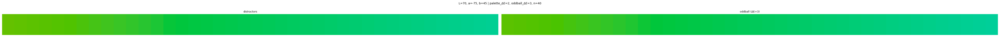

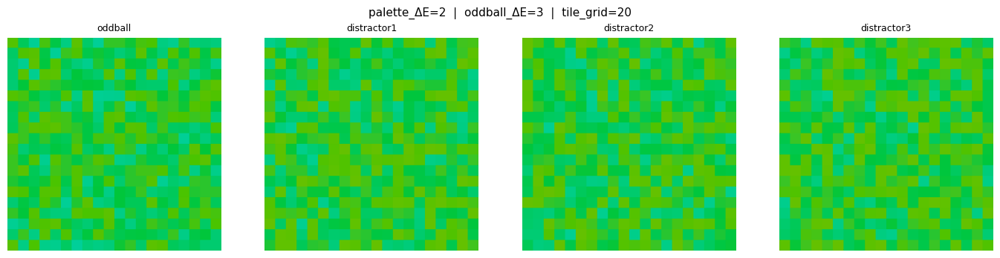

In [6]:
def lab_palette_colors(L, a, b, palette_de, n_shades):
    """Return (n_shades, 3) uint8 RGB stepping tangentially by palette_de ΔE per shade."""
    C = np.sqrt(a**2 + b**2)
    offsets = np.arange(n_shades) - (n_shades - 1) / 2.0
    lab = np.stack([np.full(n_shades, L),
                    a + offsets * palette_de * (-b / C),
                    b + offsets * palette_de * (a / C)], axis=1)
    rgb = np.clip(lab2rgb(lab.reshape(1, -1, 3))[0], 0, 1)
    return np.round(rgb * 255).astype(np.uint8)


def rotate_ab(a, b, deg):
    """Rotate an (a*, b*) anchor point by deg degrees in the a*-b* plane."""
    C = np.sqrt(a**2 + b**2)
    h = np.arctan2(b, a) + np.deg2rad(deg)
    return C * np.cos(h), C * np.sin(h)


# Suggested oddball_de difficulty levels (ΔE units)
# Easy: clearly distinguishable; Hard: perceptually similar to distractors
DIFFICULTY_LEVELS = {
    "easy":   20,   # clearly different hue
    "medium": 10,   # noticeable but requires attention
    "hard":   5,    # subtle, near-threshold
}


def make_trial(L, a, b, palette_de, oddball_de, n_shades=10, seed=42,
               tile_grid=TILE_GRID, export_dir=None):
    """
    Generate a 4AFC hue-oddball trial.

    Parameters
    ----------
    L, a, b      : CIELAB anchor (defines base hue and chroma)
    palette_de   : ΔE between adjacent shades within the palette (within-bitmap spread)
    oddball_de   : ΔE between distractor and oddball anchor points (oddball signal)
    n_shades     : number of shades in the palette
    seed         : random seed (controls both tile layout and shade proportions)
    tile_grid    : number of squares per side (e.g. 10=large squares, 20=small squares)
    export_dir   : if set, saves the 4 bitmaps as PNGs to this directory

    Design note
    -----------
    Each bitmap gets independently sampled shade proportions so that distribution
    is non-diagnostic — color is the only dimension that distinguishes the oddball.
    """
    rng = np.random.RandomState(seed)

    dist_colors = lab_palette_colors(L, a, b, palette_de, n_shades)

    C = np.sqrt(a**2 + b**2)
    deg = np.degrees(2 * np.arcsin(np.clip(oddball_de / (2 * C), 0, 1)))
    a_odd, b_odd = rotate_ab(a, b, deg)
    odd_colors = lab_palette_colors(L, a_odd, b_odd, palette_de, n_shades)

    rng2 = np.random.RandomState(seed + 1)
    bitmaps = [generate_bitmap(odd_colors,  generate_base_proportions(n_shades, rng), rng2, tile_grid)] + \
              [generate_bitmap(dist_colors, generate_base_proportions(n_shades, rng), rng2, tile_grid)
               for _ in range(3)]
    labels = ["oddball", "distractor1", "distractor2", "distractor3"]

    # Show palettes
    fig, axes = plt.subplots(1, 2, figsize=(n_shades * 1.2, 1.8))
    for ax, colors_rgb, label in zip(axes,
                                     [dist_colors, odd_colors],
                                     ["distractors", f"oddball (ΔE={oddball_de})"]):
        rgb_f = colors_rgb.astype(np.float64) / 255.0
        for i, c in enumerate(rgb_f):
            ax.add_patch(plt.Rectangle((i, 0), 1, 1, color=c))
        ax.set_xlim(0, n_shades)
        ax.set_ylim(0, 1)
        ax.axis('off')
        ax.set_title(label, fontsize=9)
    plt.suptitle(f"L={L}, a={a}, b={b} | palette_ΔE={palette_de}, oddball_ΔE={oddball_de}, n={n_shades}", fontsize=10)
    plt.tight_layout()
    plt.show()

    # Show bitmaps
    fig, axes = plt.subplots(1, 4, figsize=(14, 3.5))
    plt.suptitle(f"palette_ΔE={palette_de}  |  oddball_ΔE={oddball_de}  |  tile_grid={tile_grid}", fontsize=11)
    for ax, bm, lbl in zip(axes, bitmaps, labels):
        ax.imshow(bm)
        ax.set_title(lbl, fontsize=9)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

    if export_dir is not None:
        import os
        from PIL import Image as PILImage
        os.makedirs(export_dir, exist_ok=True)
        stem = f"L{L}_a{a}_b{b}_pde{palette_de}_ode{oddball_de}_n{n_shades}_tg{tile_grid}_seed{seed}"
        for bm, lbl in zip(bitmaps, labels):
            PILImage.fromarray(bm).save(os.path.join(export_dir, f"{stem}_{lbl}.png"))
        print(f"Saved 4 bitmaps to {export_dir}/  [{stem}_*.png]")


# ── Example ───────────────────────────────────────────────────────────────────
make_trial(L=70, a=-75, b=45, palette_de=2, oddball_de=3, n_shades=40)


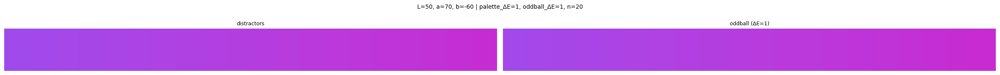

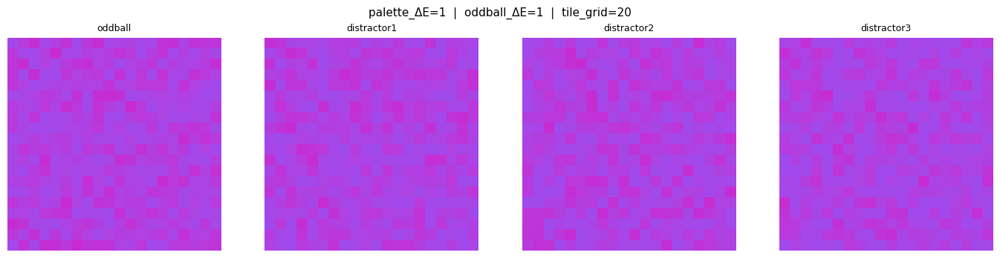

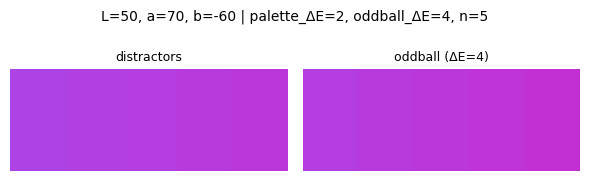

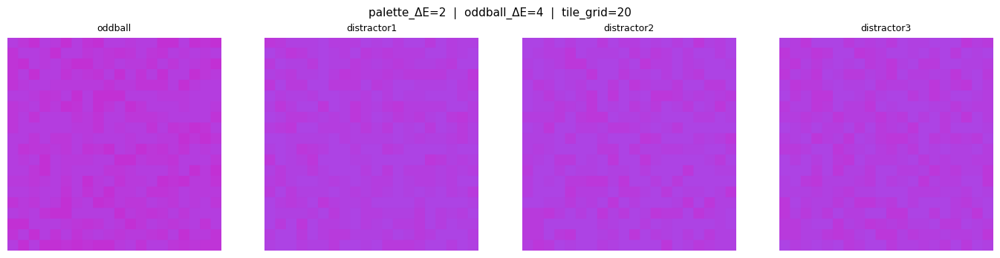

In [7]:
#PURPLE-PINK  (anchor C ≈ 92, so 1° ≈ ΔE 1.6)
make_trial(L=50, a=70, b=-60, palette_de=1, oddball_de=1,  n_shades=20)
make_trial(L=50, a=70, b=-60, palette_de=2, oddball_de=4,  n_shades=5)



#make_trial(L=60, a=70, b=-60, palette_de=4, oddball_de=3,  n_shades=10)
#make_trial(L=60, a=70, b=-60, palette_de=4, oddball_de=5,  n_shades=10)
#make_trial(L=60, a=70, b=-60, palette_de=4, oddball_de=10, n_shades=10)
#make_trial(L=60, a=70, b=-60, palette_de=4, oddball_de=15, n_shades=10)


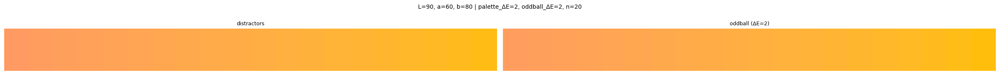

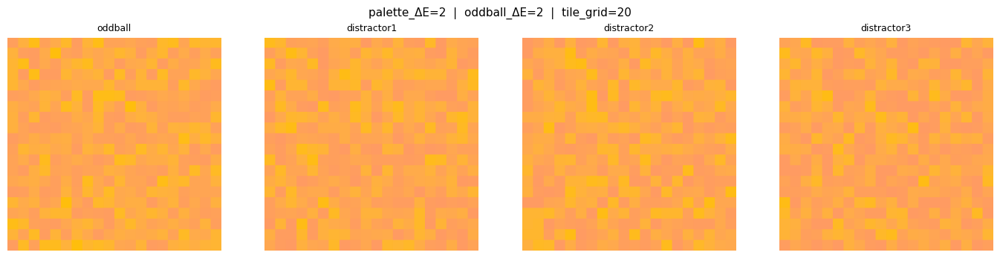

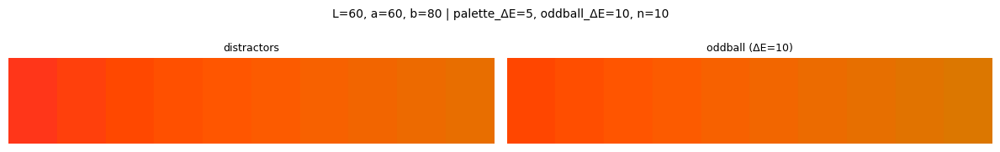

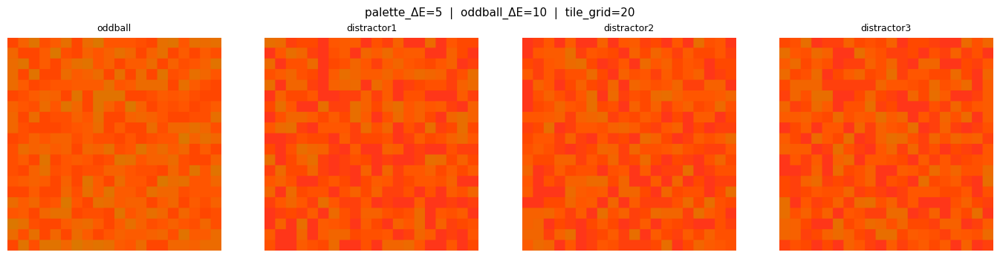

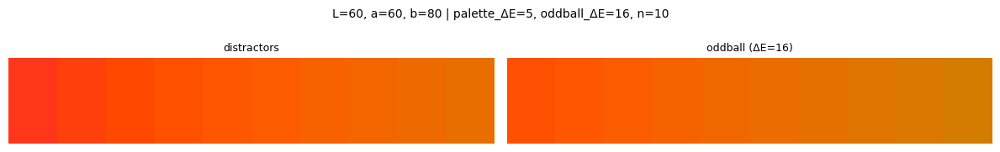

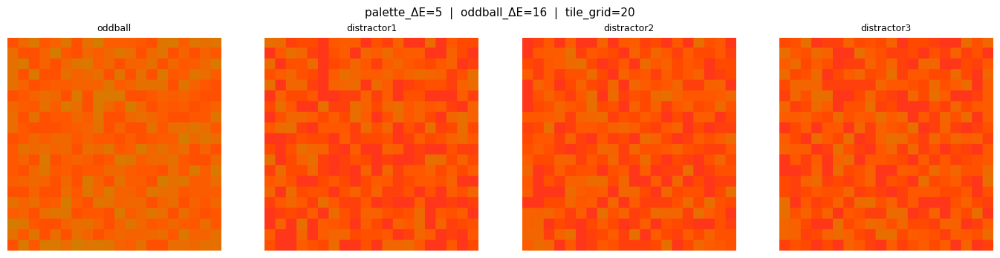

In [8]:
#ORANGE  (anchor C = 100)
make_trial(L=90, a=60, b=80, palette_de=2, oddball_de=2,  n_shades=20)
make_trial(L=60, a=60, b=80, palette_de=5, oddball_de=10, n_shades=10)
make_trial(L=60, a=60, b=80, palette_de=5, oddball_de=16, n_shades=10)


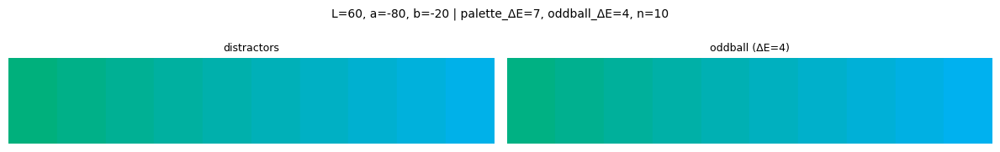

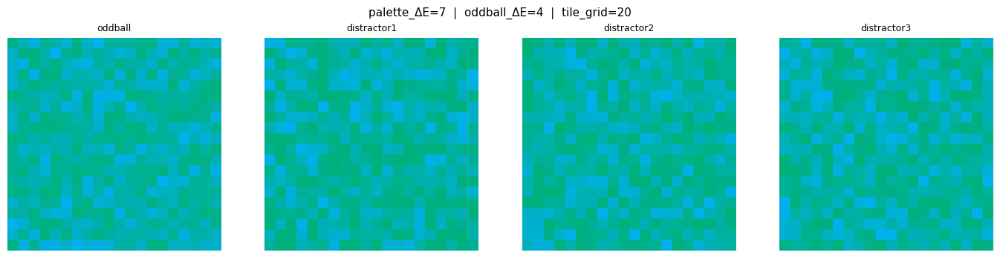

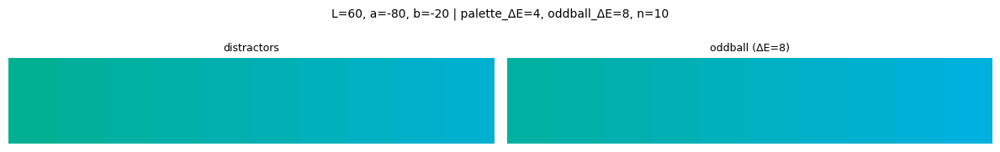

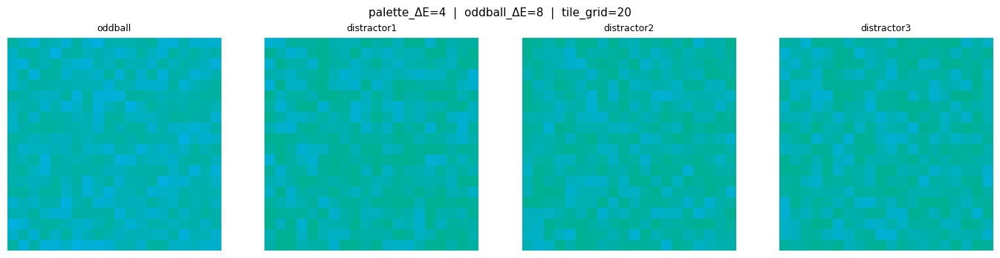

In [9]:
#TEAL  (anchor C ≈ 83)
make_trial(L=60, a=-80, b=-20, palette_de=7, oddball_de=4,  n_shades=10)
make_trial(L=60, a=-80, b=-20, palette_de=4, oddball_de=8,  n_shades=10)


#make_trial(L=60, a=-80, b=-20, palette_de=7, oddball_de=9,  n_shades=10)
#make_trial(L=60, a=-80, b=-20, palette_de=7, oddball_de=13, n_shades=10)


## Palette → Bitmap workflow

1. Pick anchor (L, a, b) — defines the base hue and chroma
2. Set `palette_de` — ΔE between adjacent shades (within-bitmap spread)
3. Set `oddball_de` — ΔE between distractor and oddball anchor points (oddball signal)
4. Call `make_trial(L, a, b, palette_de, oddball_de, n_shades)`

**Difficulty landmarks (CIELAB ΔE):**
- ΔE ~1–2: near threshold
- ΔE ~5–10: clearly discriminable, similar category
- ΔE ~20+: categorically different

**Note:** Effective oddball discriminability ≈ `oddball_de − palette_de × (n_shades / 2)`.
A wider palette requires a larger `oddball_de` to place the oddball outside the distractor range.


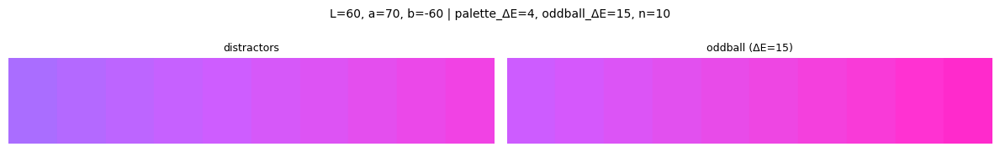

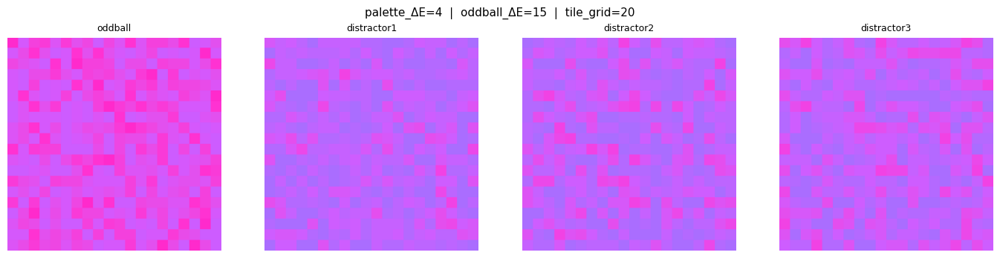

Saved 4 bitmaps to trial_exports/R/  [L60_a70_b-60_pde4_ode15_n10_tg20_seed0_*.png]


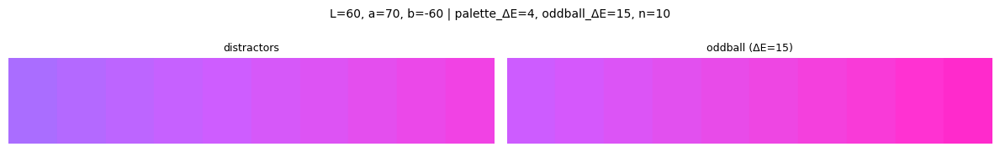

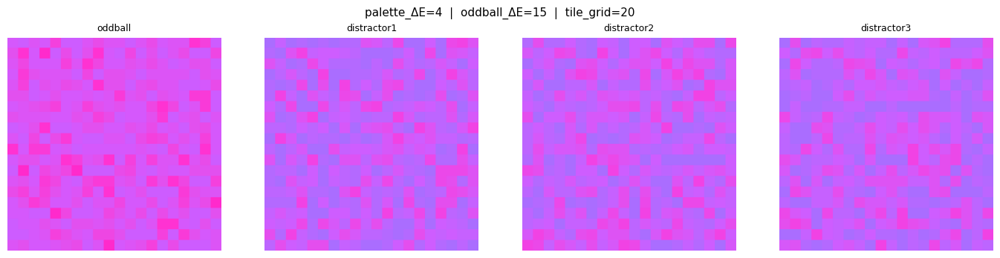

Saved 4 bitmaps to trial_exports/R/  [L60_a70_b-60_pde4_ode15_n10_tg20_seed1_*.png]


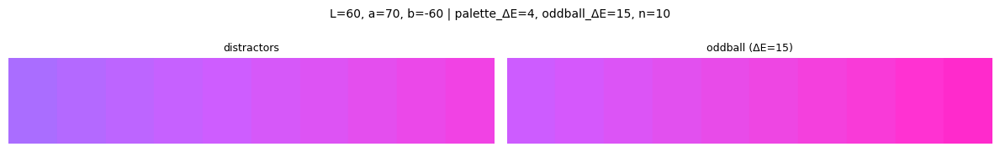

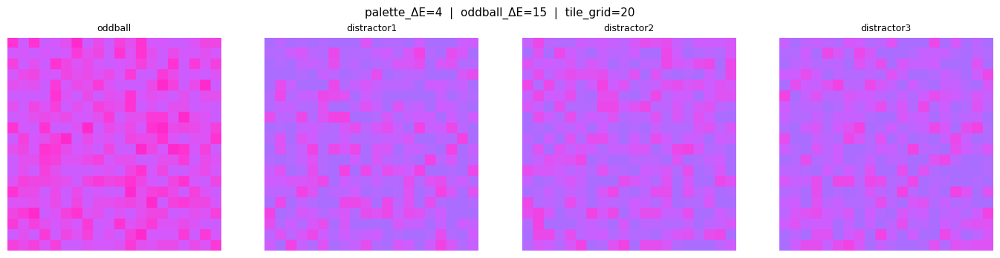

Saved 4 bitmaps to trial_exports/R/  [L60_a70_b-60_pde4_ode15_n10_tg20_seed2_*.png]


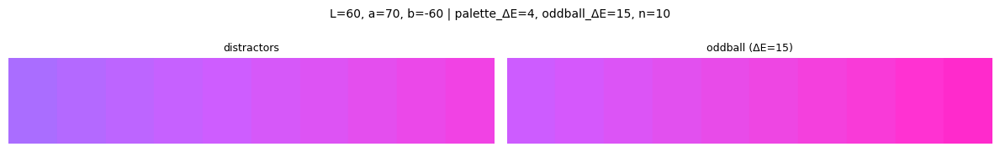

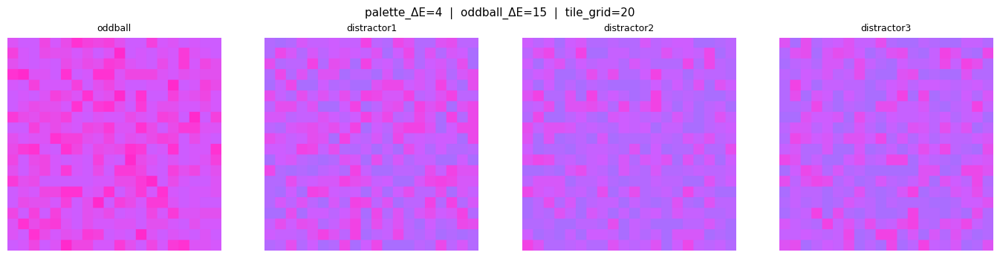

Saved 4 bitmaps to trial_exports/R/  [L60_a70_b-60_pde4_ode15_n10_tg20_seed3_*.png]


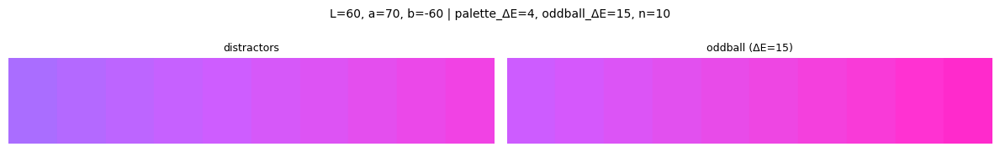

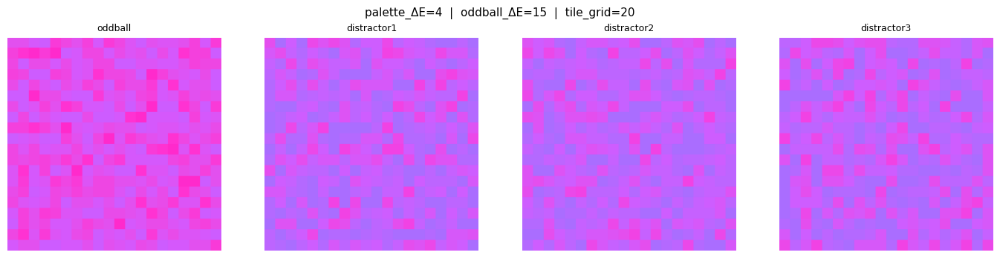

Saved 4 bitmaps to trial_exports/R/  [L60_a70_b-60_pde4_ode15_n10_tg20_seed4_*.png]


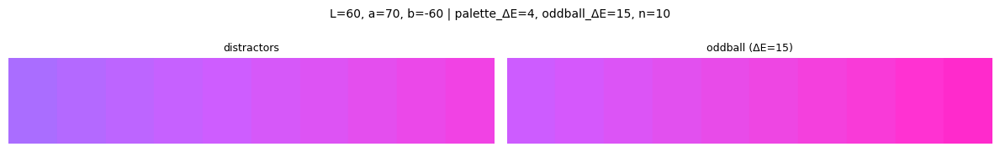

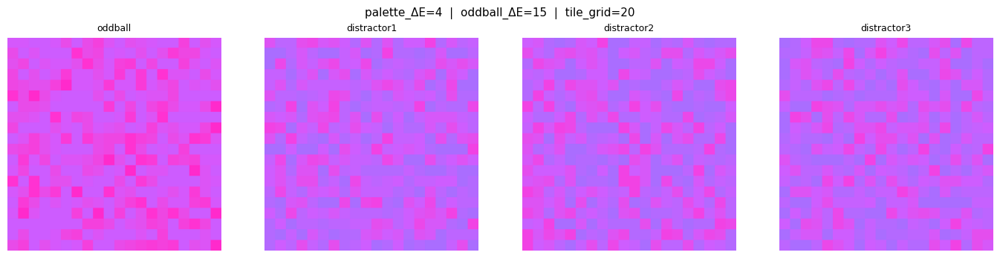

Saved 4 bitmaps to trial_exports/R/  [L60_a70_b-60_pde4_ode15_n10_tg20_seed5_*.png]


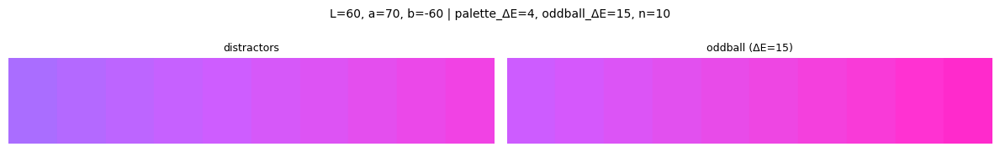

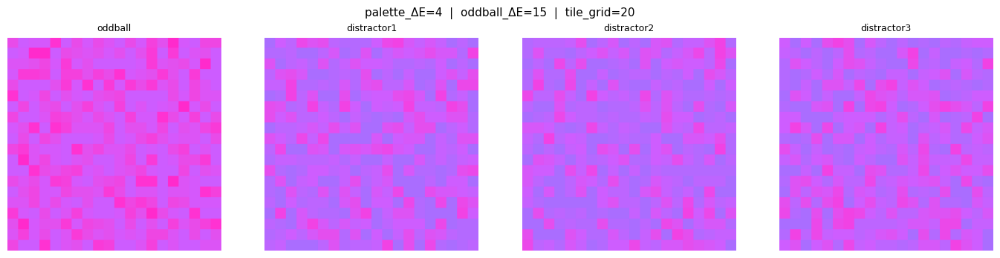

Saved 4 bitmaps to trial_exports/R/  [L60_a70_b-60_pde4_ode15_n10_tg20_seed6_*.png]


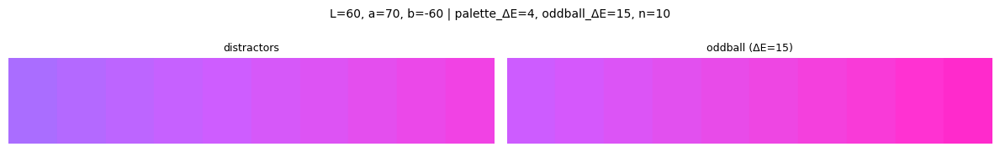

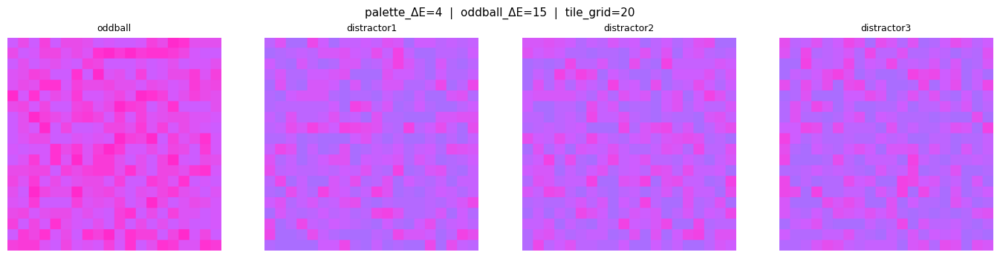

Saved 4 bitmaps to trial_exports/R/  [L60_a70_b-60_pde4_ode15_n10_tg20_seed7_*.png]


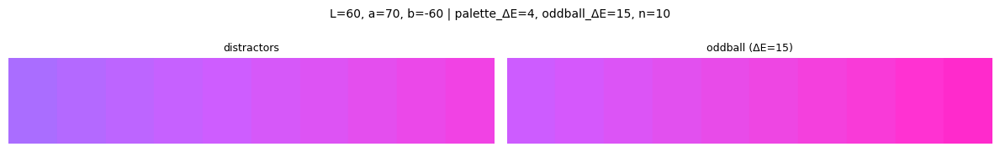

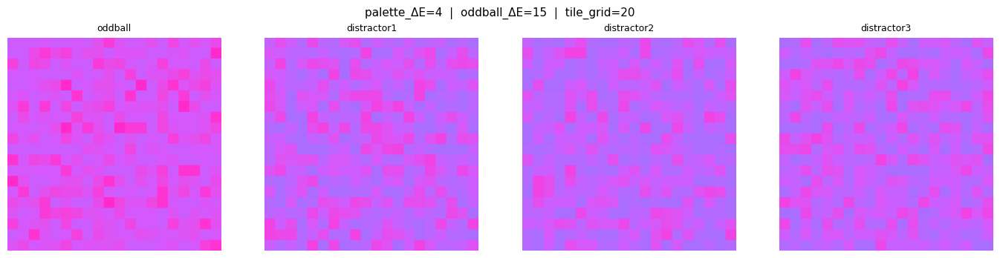

Saved 4 bitmaps to trial_exports/R/  [L60_a70_b-60_pde4_ode15_n10_tg20_seed8_*.png]


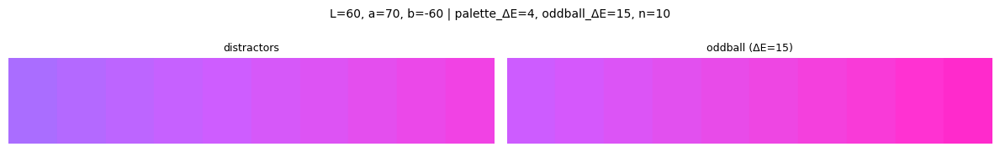

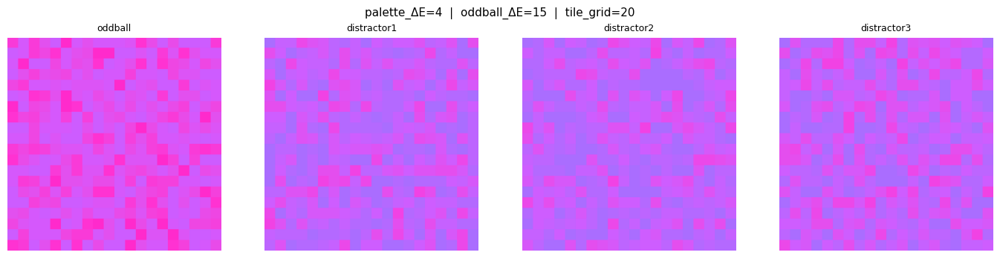

Saved 4 bitmaps to trial_exports/R/  [L60_a70_b-60_pde4_ode15_n10_tg20_seed9_*.png]


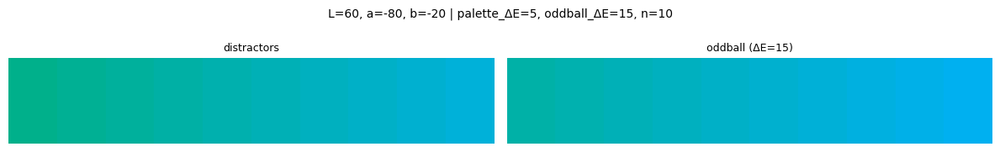

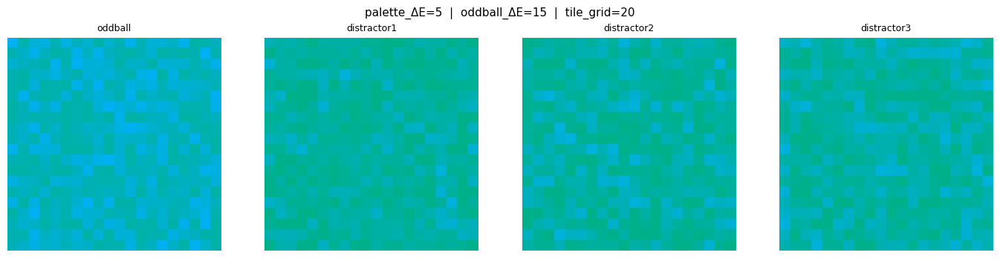

Saved 4 bitmaps to trial_exports/B/  [L60_a-80_b-20_pde5_ode15_n10_tg20_seed0_*.png]


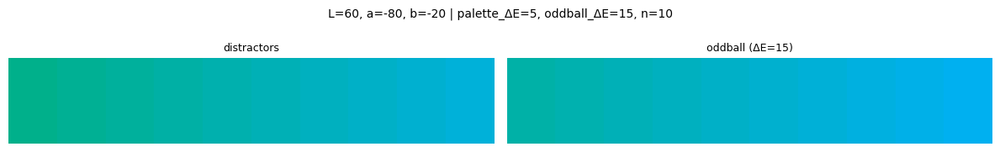

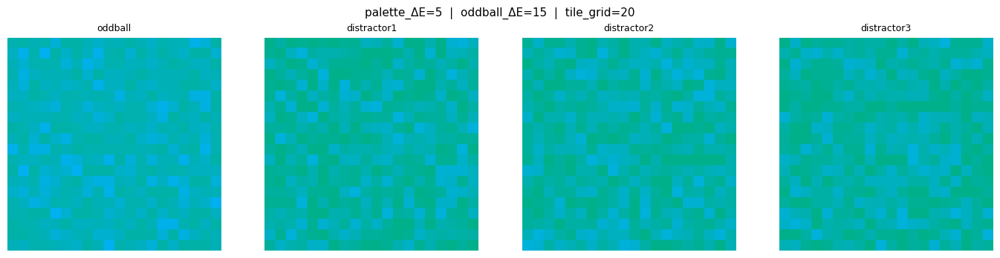

Saved 4 bitmaps to trial_exports/B/  [L60_a-80_b-20_pde5_ode15_n10_tg20_seed1_*.png]


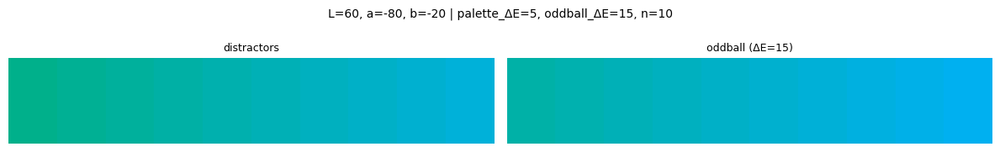

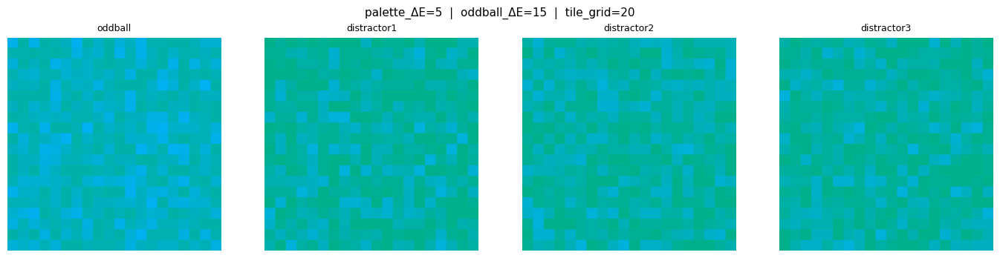

Saved 4 bitmaps to trial_exports/B/  [L60_a-80_b-20_pde5_ode15_n10_tg20_seed2_*.png]


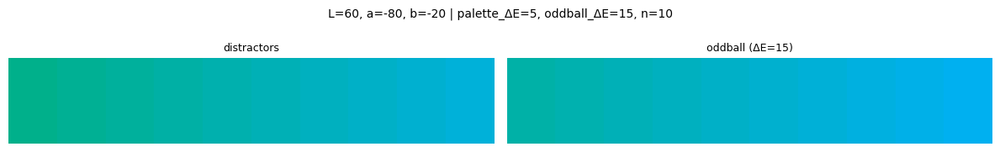

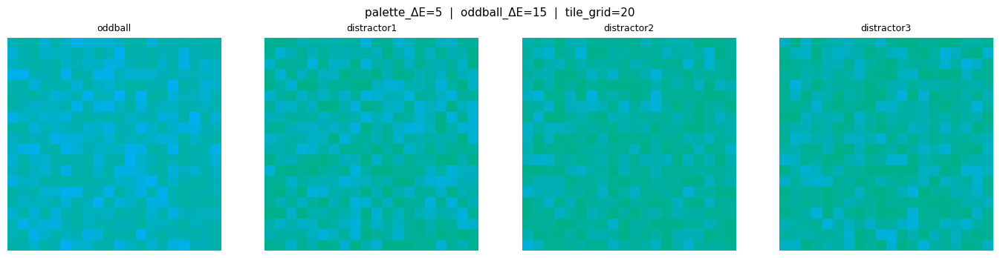

Saved 4 bitmaps to trial_exports/B/  [L60_a-80_b-20_pde5_ode15_n10_tg20_seed3_*.png]


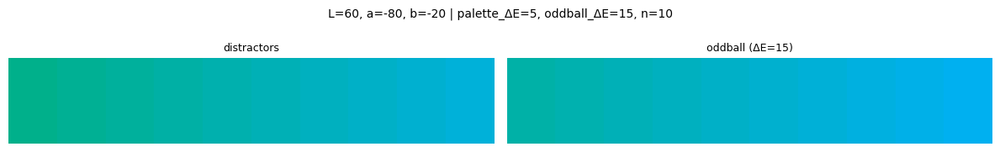

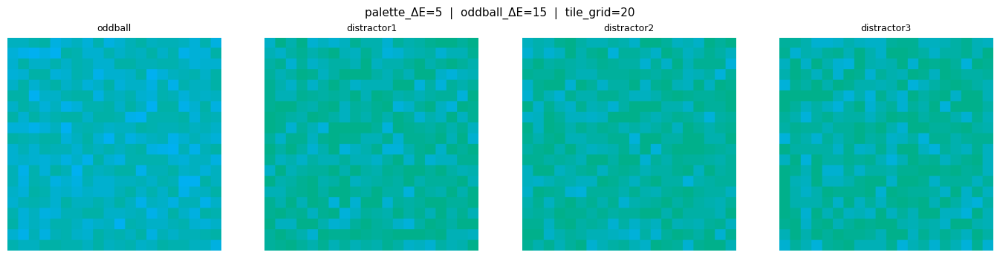

Saved 4 bitmaps to trial_exports/B/  [L60_a-80_b-20_pde5_ode15_n10_tg20_seed4_*.png]


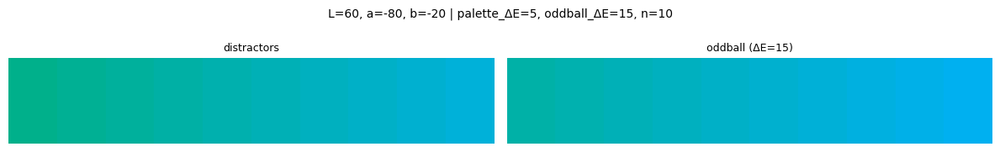

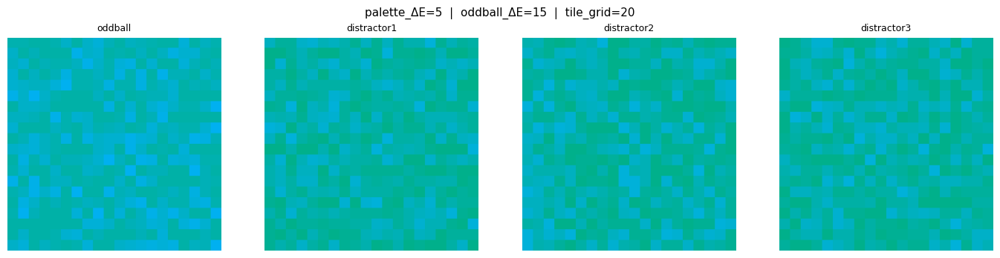

Saved 4 bitmaps to trial_exports/B/  [L60_a-80_b-20_pde5_ode15_n10_tg20_seed5_*.png]


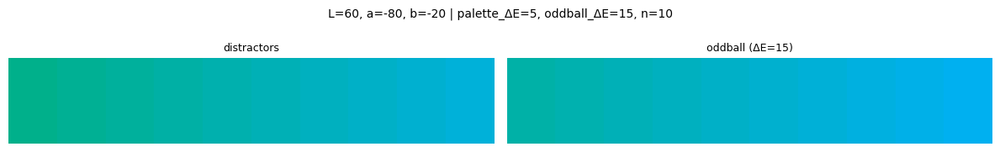

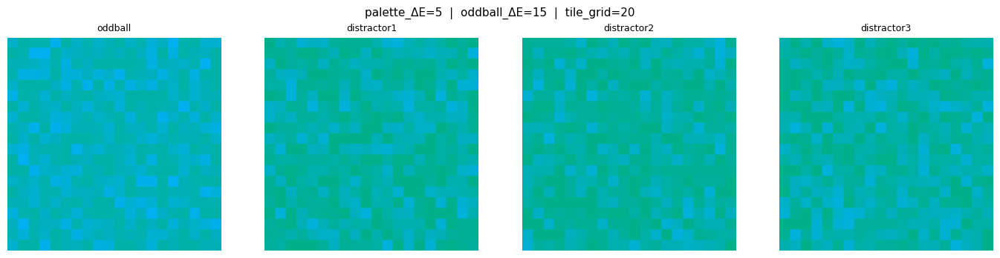

Saved 4 bitmaps to trial_exports/B/  [L60_a-80_b-20_pde5_ode15_n10_tg20_seed6_*.png]


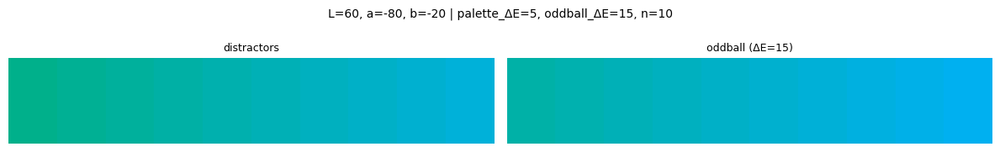

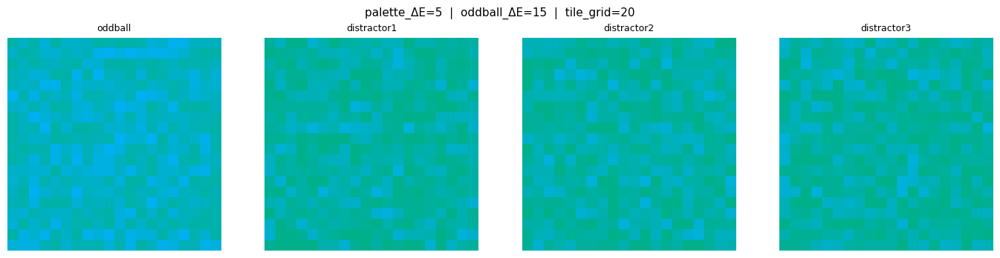

Saved 4 bitmaps to trial_exports/B/  [L60_a-80_b-20_pde5_ode15_n10_tg20_seed7_*.png]


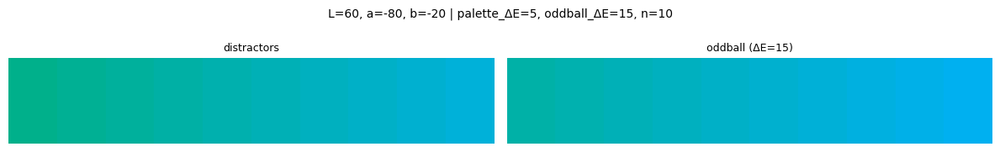

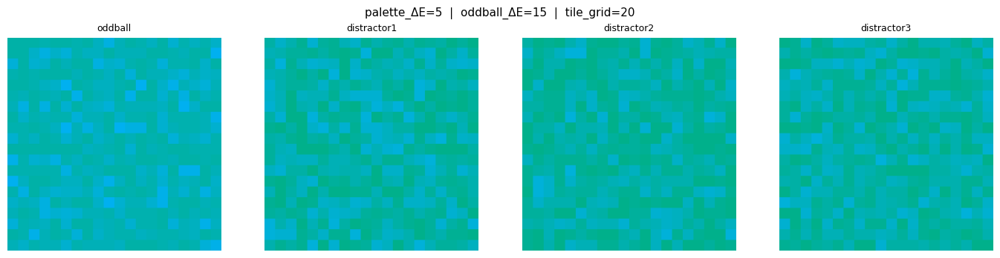

Saved 4 bitmaps to trial_exports/B/  [L60_a-80_b-20_pde5_ode15_n10_tg20_seed8_*.png]


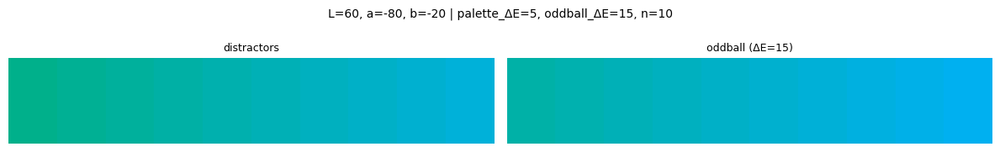

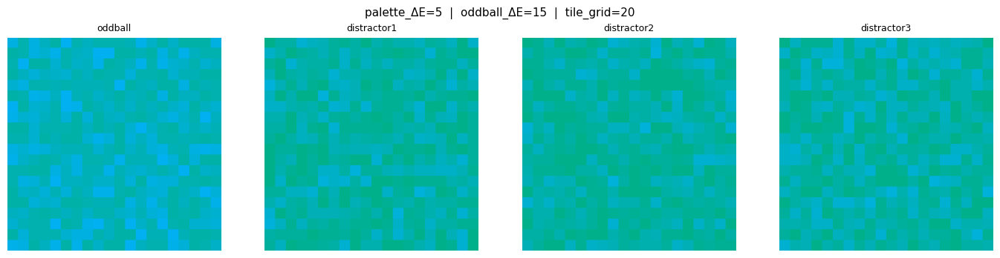

Saved 4 bitmaps to trial_exports/B/  [L60_a-80_b-20_pde5_ode15_n10_tg20_seed9_*.png]


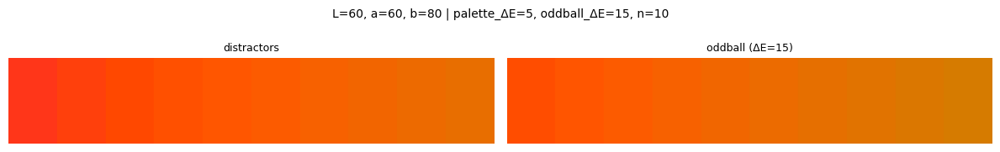

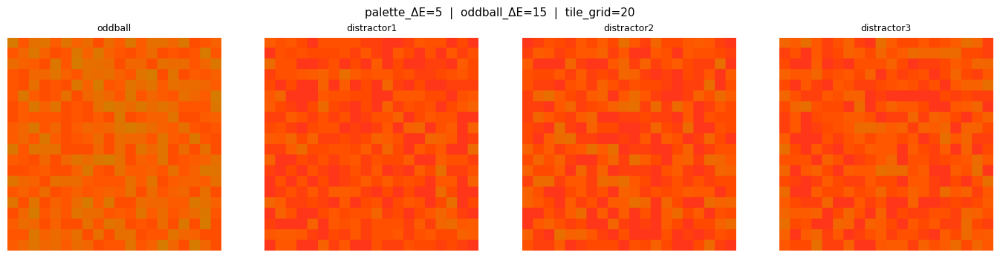

Saved 4 bitmaps to trial_exports/G/  [L60_a60_b80_pde5_ode15_n10_tg20_seed0_*.png]


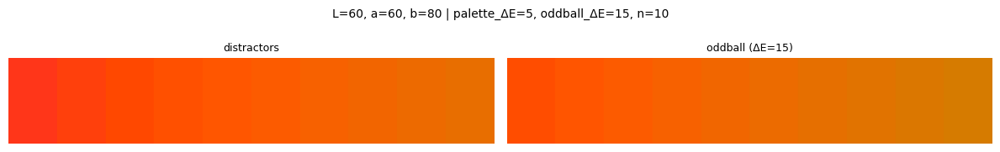

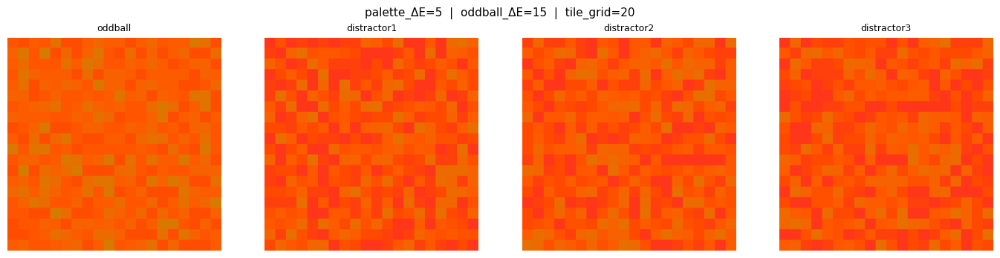

Saved 4 bitmaps to trial_exports/G/  [L60_a60_b80_pde5_ode15_n10_tg20_seed1_*.png]


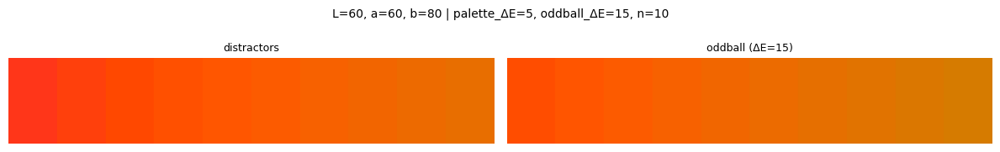

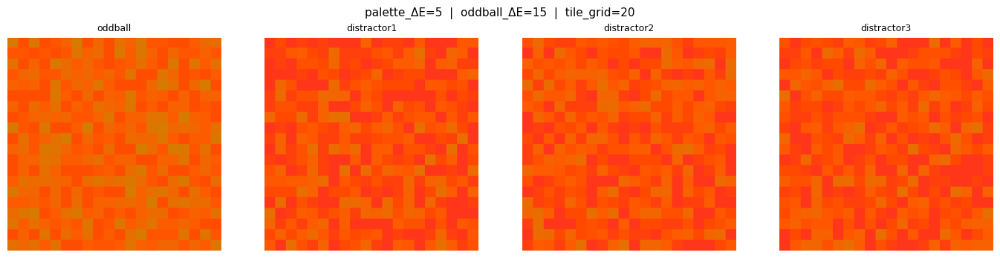

Saved 4 bitmaps to trial_exports/G/  [L60_a60_b80_pde5_ode15_n10_tg20_seed2_*.png]


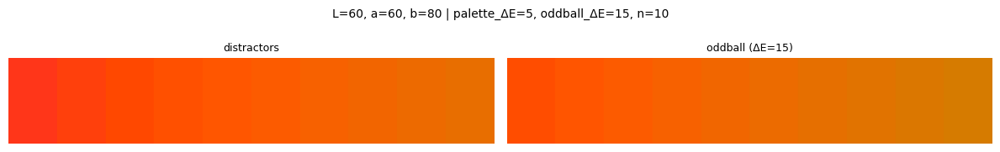

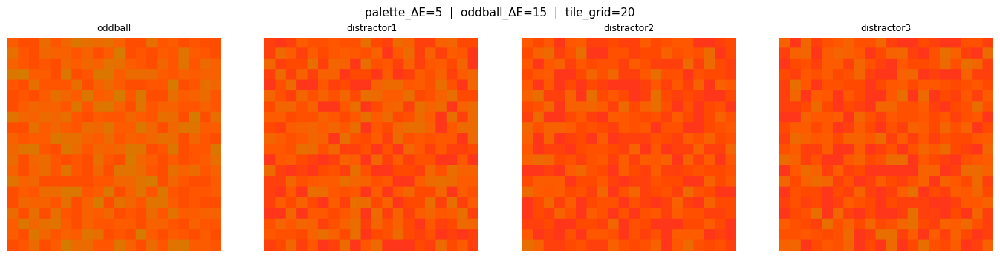

Saved 4 bitmaps to trial_exports/G/  [L60_a60_b80_pde5_ode15_n10_tg20_seed3_*.png]


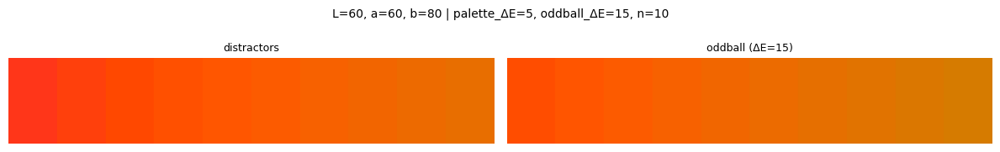

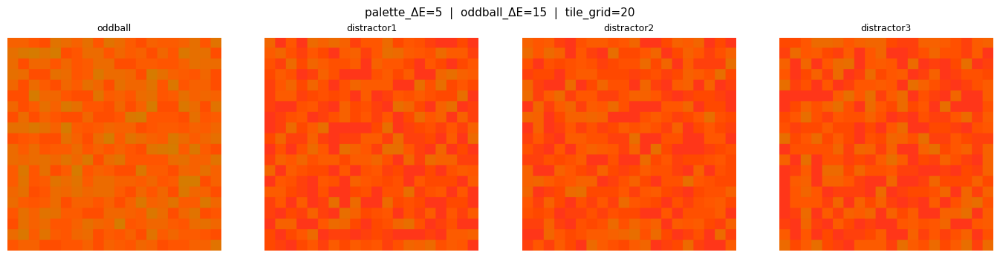

Saved 4 bitmaps to trial_exports/G/  [L60_a60_b80_pde5_ode15_n10_tg20_seed4_*.png]


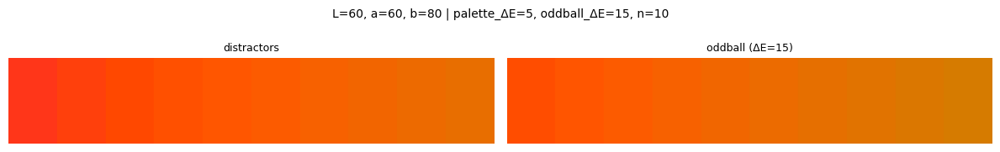

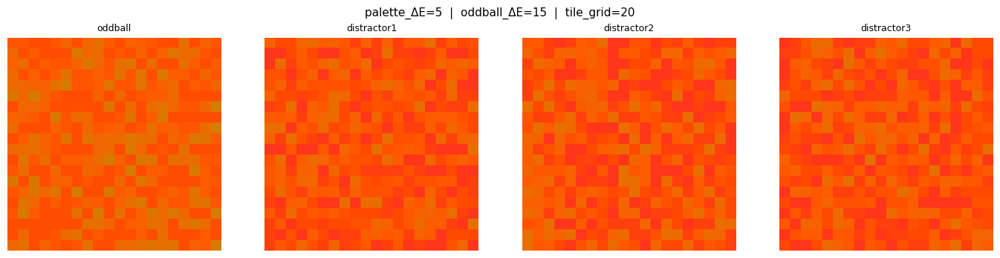

Saved 4 bitmaps to trial_exports/G/  [L60_a60_b80_pde5_ode15_n10_tg20_seed5_*.png]


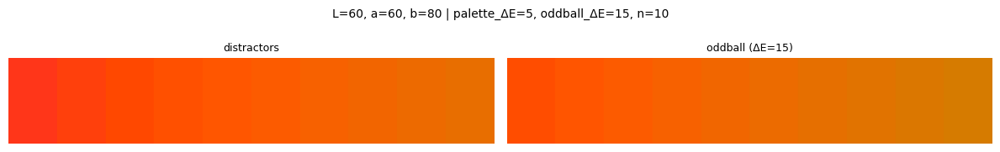

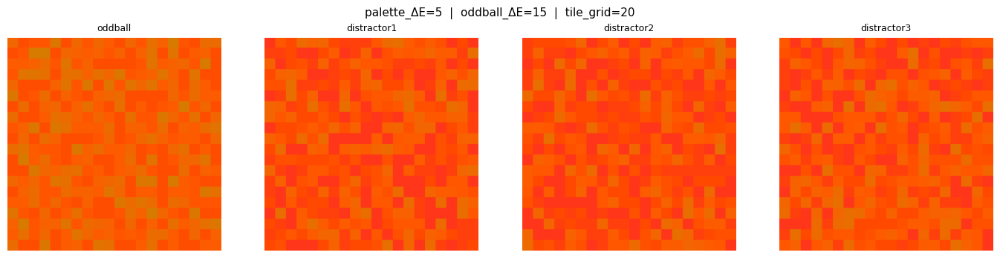

Saved 4 bitmaps to trial_exports/G/  [L60_a60_b80_pde5_ode15_n10_tg20_seed6_*.png]


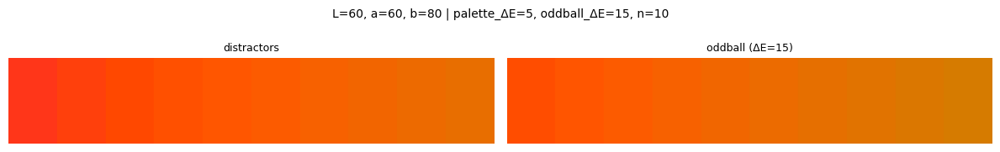

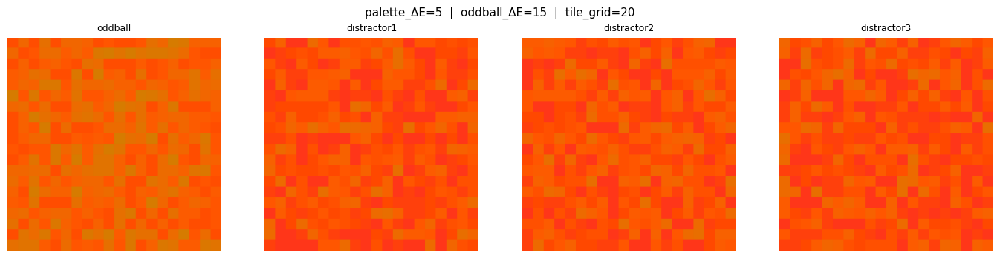

Saved 4 bitmaps to trial_exports/G/  [L60_a60_b80_pde5_ode15_n10_tg20_seed7_*.png]


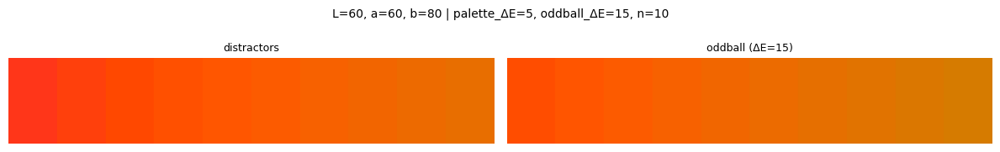

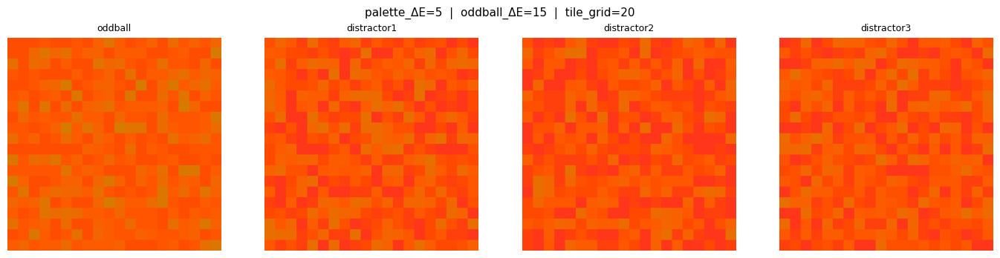

Saved 4 bitmaps to trial_exports/G/  [L60_a60_b80_pde5_ode15_n10_tg20_seed8_*.png]


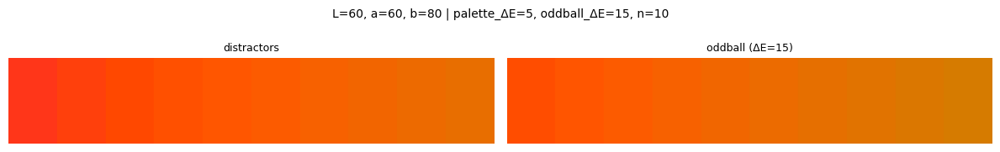

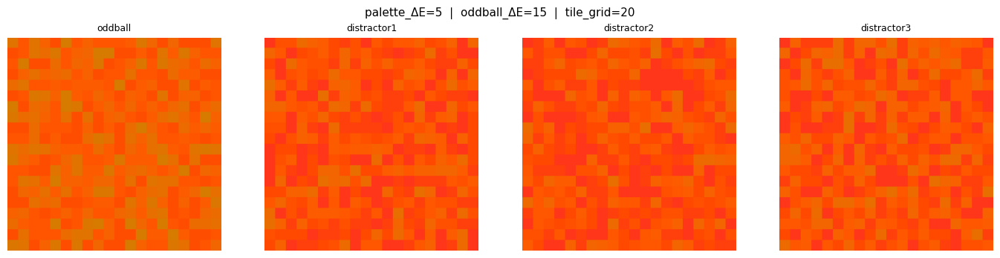

Saved 4 bitmaps to trial_exports/G/  [L60_a60_b80_pde5_ode15_n10_tg20_seed9_*.png]


In [10]:
import os

# ── Hue anchor configs ────────────────────────────────────────────────────────
# Each entry: (L, a, b, palette_de, n_shades)
# Fill in placeholders as you settle on anchors

HUE_CONFIGS = {
   # "Y":   (..., ..., ..., ..., ...),   # yellow       — not yet defined
  #  "O":   (..., ..., ..., ..., ...),   # orange       — not yet defined
    "R":   (60,  70, -60,    4,  10),   # red-pink     — from cell-9
  #  "Pi":  (..., ..., ..., ..., ...),   # pink         — not yet defined
  #  "Pur": (..., ..., ..., ..., ...),   # purple       — not yet defined
    "B":   (60, -80, -20,    5,  10),   # blue         — from cell-11
    "G":   (60,  60,  80,    5,  10),   # yellow-green — from cell-10
}

SEEDS = list(range(10))   # 10 spatial layouts per condition

# Placeholder oddball_de — replace with calibrated values after piloting
PLACEHOLDER_ODE = 15


def export_palettes(hue_configs, oddball_de, seeds, export_dir="trial_exports"):
    """Export bitmap trials for all defined hue anchors."""
    for hue, config in hue_configs.items():
        if ... in config:
            print(f"Skipping {hue} — anchor not yet defined")
            continue
        L, a, b, palette_de, n_shades = config
        for seed in seeds:
            make_trial(L, a, b,
                       palette_de = palette_de,
                       oddball_de = oddball_de,
                       n_shades   = n_shades,
                       seed       = seed,
                       export_dir = os.path.join(export_dir, hue))


# Uncomment to run:
export_palettes(HUE_CONFIGS, oddball_de=PLACEHOLDER_ODE, seeds=SEEDS)


In [11]:
# generating hue rings
export_folder = '/Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials'

In [12]:
def generate_hue_ring(L, C, n_colors, offset_deg=0):
    """
    Sample n_colors evenly around the a*/b* plane at fixed luminance (L) and chroma (C).
    offset_deg rotates the entire ring.
    Returns (n_colors, 3) uint8 RGB array.
    """
    angles = np.linspace(0, 360, n_colors, endpoint=False) + offset_deg
    a_vals = C * np.cos(np.deg2rad(angles))
    b_vals = C * np.sin(np.deg2rad(angles))

    lab = np.stack([np.full(n_colors, L), a_vals, b_vals], axis=1)
    rgb = np.clip(lab2rgb(lab.reshape(1, -1, 3))[0], 0, 1)
    return np.round(rgb * 255).astype(np.uint8)


def select_pairs(ring_rgb, min_de, max_de):
    """
    Return all (i, j) index pairs from ring_rgb whose ΔE falls within [min_de, max_de].
    ΔE is computed in CIELAB from the RGB values.
    """
    lab = rgb2lab(ring_rgb.reshape(1, -1, 3).astype(np.float64) / 255.0)[0]
    pairs = []
    n = len(lab)
    for i in range(n):
        for j in range(i + 1, n):
            de = np.sqrt(np.sum((lab[i] - lab[j]) ** 2))
            if min_de <= de <= max_de:
                pairs.append((i, j))
    return pairs


def make_trial_from_pair(L, dist_ab, odd_ab, palette_de, n_shades=10,
                         seed=42, tile_grid=TILE_GRID, export_dir=None):
    """
    Like make_trial, but takes explicit distractor and oddball anchors
    instead of computing the oddball via rotation.

    dist_ab, odd_ab : (a, b) tuples for the distractor and oddball anchors
    tile_grid       : number of squares per side (e.g. 10=large, 20=small)

    Returns
    -------
    bitmaps : [oddball, distractor1, distractor2, distractor3] as uint8 arrays
    """
    rng  = np.random.RandomState(seed)
    rng2 = np.random.RandomState(seed + 1)

    dist_colors = lab_palette_colors(L, dist_ab[0], dist_ab[1], palette_de, n_shades)
    odd_colors  = lab_palette_colors(L,  odd_ab[0],  odd_ab[1], palette_de, n_shades)

    de = np.sqrt((dist_ab[0] - odd_ab[0])**2 + (dist_ab[1] - odd_ab[1])**2)

    bitmaps = [generate_bitmap(odd_colors,  generate_base_proportions(n_shades, rng), rng2, tile_grid)] + \
              [generate_bitmap(dist_colors, generate_base_proportions(n_shades, rng), rng2, tile_grid)
               for _ in range(3)]
    labels = ["oddball", "distractor1", "distractor2", "distractor3"]

    # Show palettes
    fig, axes = plt.subplots(1, 2, figsize=(n_shades * 1.2, 1.8))
    for ax, colors_rgb, label in zip(axes,
                                     [dist_colors, odd_colors],
                                     ["distractors", f"oddball (ΔE={de:.1f})"]):
        rgb_f = colors_rgb.astype(np.float64) / 255.0
        for i, c in enumerate(rgb_f):
            ax.add_patch(plt.Rectangle((i, 0), 1, 1, color=c))
        ax.set_xlim(0, n_shades)
        ax.set_ylim(0, 1)
        ax.axis('off')
        ax.set_title(label, fontsize=9)
    plt.suptitle(f"L={L}, dist_ab={dist_ab}, odd_ab={odd_ab} | palette_ΔE={palette_de}", fontsize=10)
    plt.tight_layout()
    plt.show()

    # Show bitmaps
    fig, axes = plt.subplots(1, 4, figsize=(14, 3.5))
    plt.suptitle(f"palette_ΔE={palette_de}  |  oddball_ΔE={de:.1f}  |  tile_grid={tile_grid}", fontsize=11)
    for ax, bm, lbl in zip(axes, bitmaps, labels):
        ax.imshow(bm)
        ax.set_title(lbl, fontsize=9)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

    if export_dir is not None:
        os.makedirs(export_dir, exist_ok=True)
        stem = f"L{L}_dist{dist_ab}_odd{odd_ab}_pde{palette_de}_tg{tile_grid}_seed{seed}"
        for bm, lbl in zip(bitmaps, labels):
            PILImage.fromarray(bm).save(os.path.join(export_dir, f"{stem}_{lbl}.png"))
        print(f"Saved to {export_dir}/  [{stem}_*.png]")

    return bitmaps


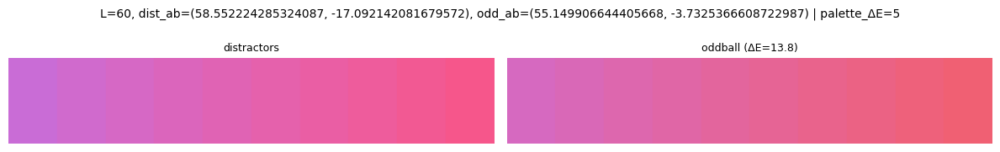

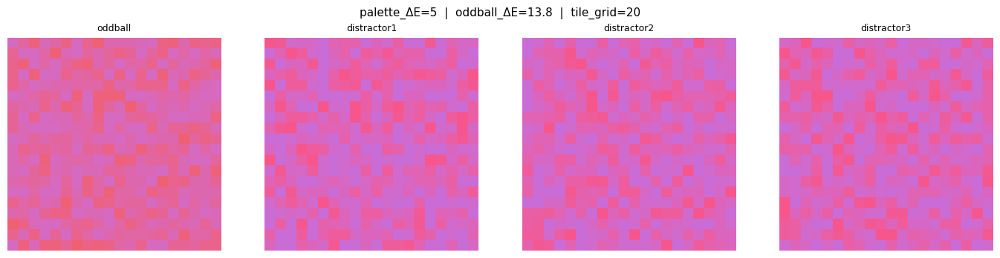

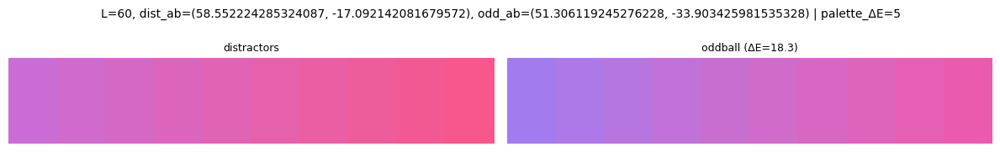

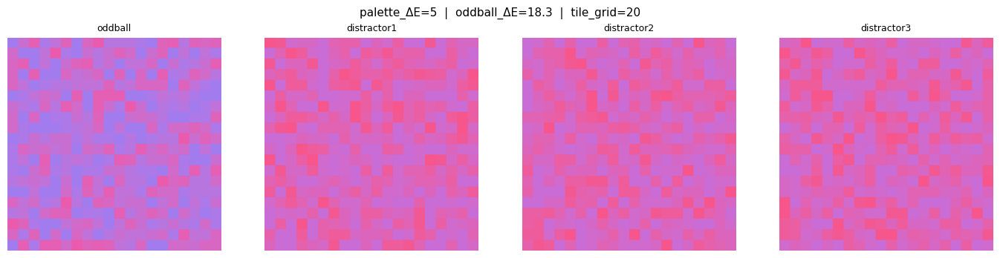

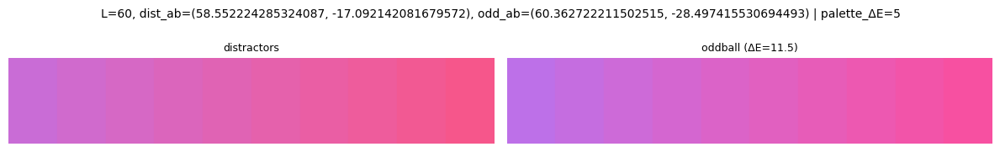

...

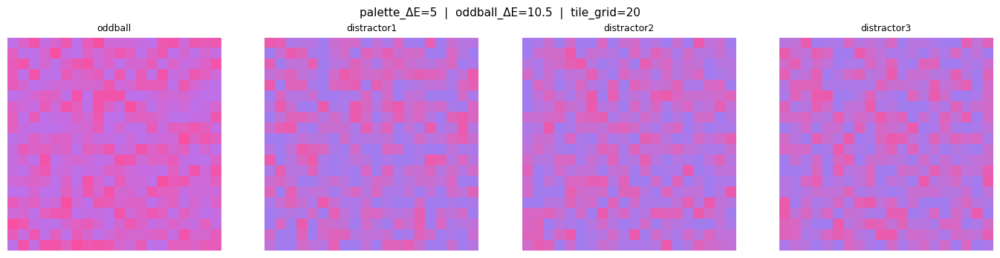

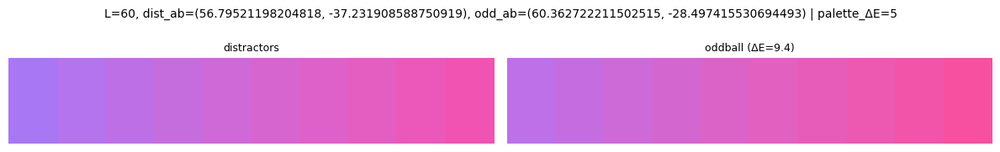

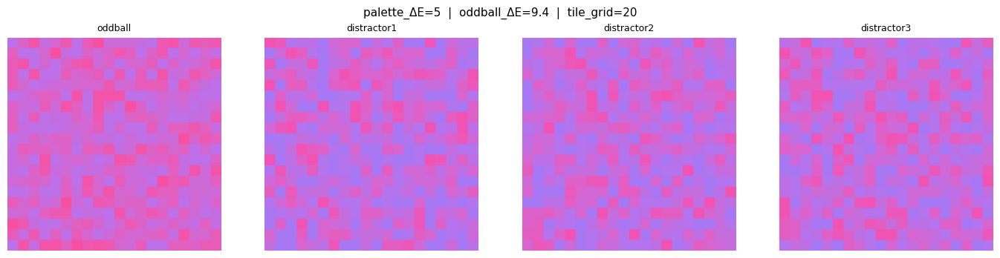

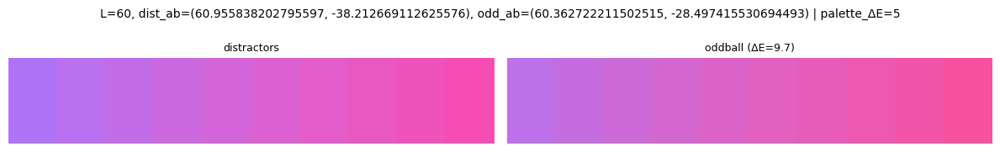

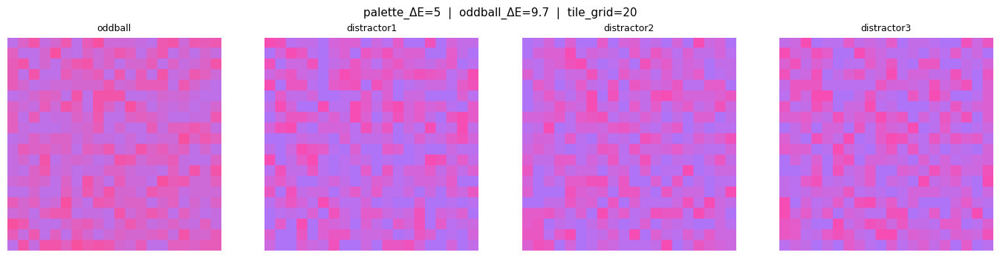

In [13]:
ring = generate_hue_ring(L=80, C=80, n_colors=36, offset_deg=0)
pairs = select_pairs(ring, min_de=5, max_de=20)

lab = rgb2lab(ring.reshape(1,-1,3).astype(np.float64)/255.0)[0]
for i, j in pairs:
    make_trial_from_pair(L=60,
                         dist_ab=(lab[i,1], lab[i,2]),
                         odd_ab =(lab[j,1], lab[j,2]),
                         palette_de=5, n_shades=10)


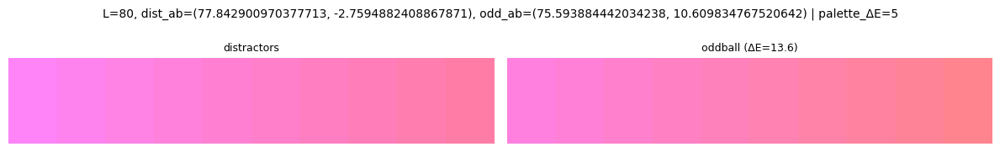

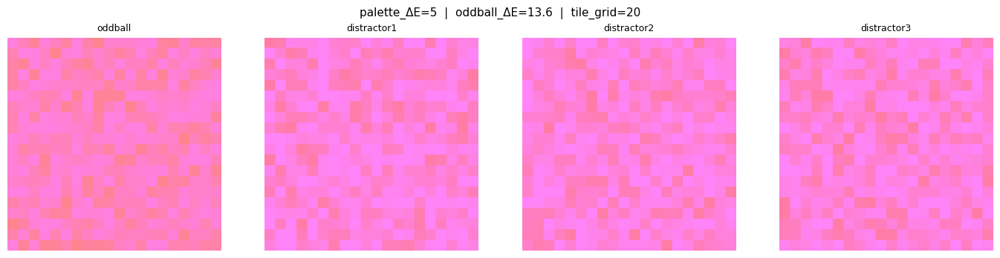

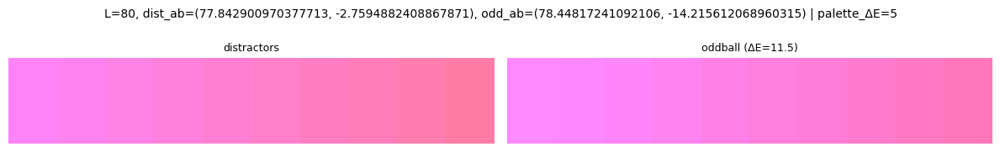

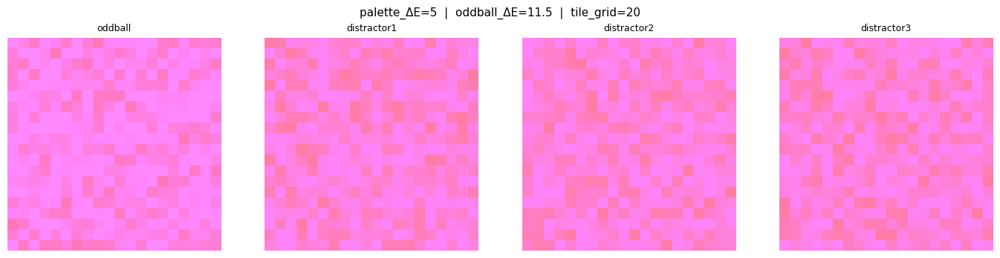

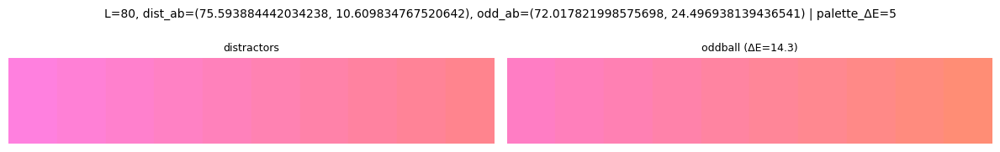

...

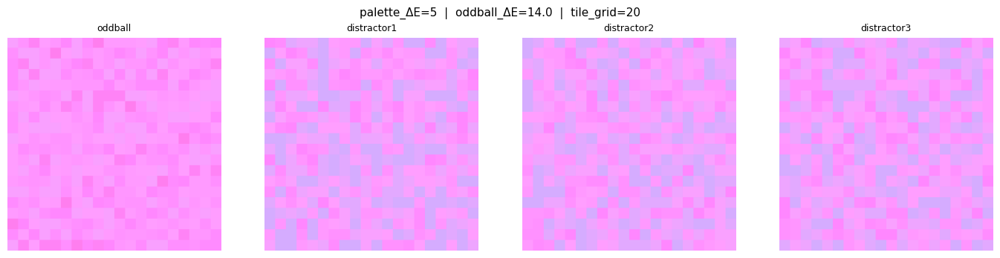

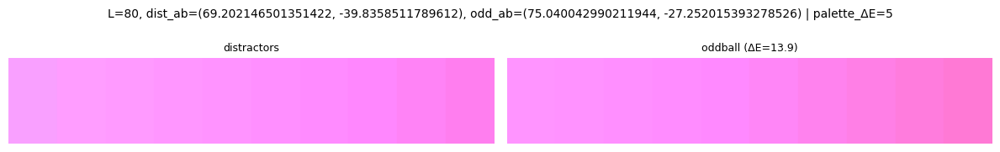

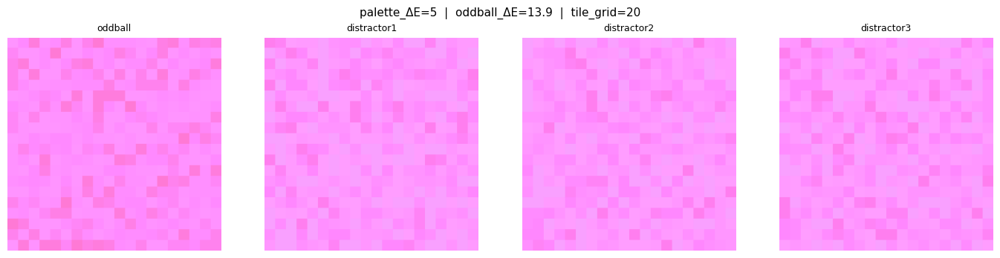

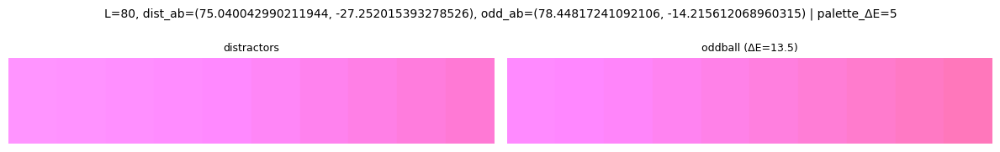

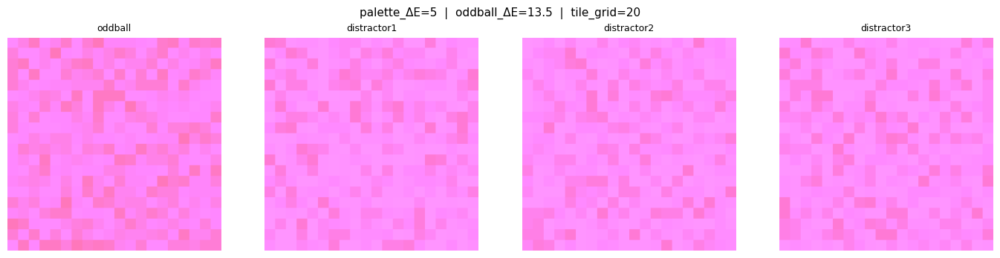

In [14]:
ring = generate_hue_ring(L=60, C=80, n_colors=36, offset_deg=0)
pairs = select_pairs(ring, min_de=5, max_de=20)

lab = rgb2lab(ring.reshape(1,-1,3).astype(np.float64)/255.0)[0]
for i, j in pairs:
    make_trial_from_pair(L=80,
                         dist_ab=(lab[i,1], lab[i,2]),
                         odd_ab =(lab[j,1], lab[j,2]),
                         palette_de=5, n_shades=10)

In [15]:
import base64, io
from PIL import Image as PILImage

def export_html(trial_sets, output_path="trial_gallery.html"):
    """
    trial_sets: list of dicts, each with:
        'bitmaps' : [oddball, dist1, dist2, dist3] as numpy arrays
        'title'   : string describing the trial
    """

    def to_base64(arr):
        buf = io.BytesIO()
        PILImage.fromarray(arr).save(buf, format="PNG")
        return base64.b64encode(buf.getvalue()).decode()

    rows = []
    for trial in trial_sets:
        labels = ["oddball", "distractor 1", "distractor 2", "distractor 3"]
        imgs = "".join(
            f"""<div style="text-align:center; font-family:sans-serif">
                  <img src="data:image/png;base64,{to_base64(bm)}" width="180"/>
                  <p style="margin:4px">{lbl}</p>
                </div>"""
            for bm, lbl in zip(trial["bitmaps"], labels)
        )
        rows.append(
            f"""<div style="margin-bottom:30px">
                  <h3 style="font-family:sans-serif">{trial["title"]}</h3>
                  <div style="display:flex; gap:12px">{imgs}</div>
                </div><hr/>"""
        )

    html = f"<html><body>{''.join(rows)}</body></html>"
    with open(output_path, "w") as f:
        f.write(html)
    print(f"Saved → {output_path}")


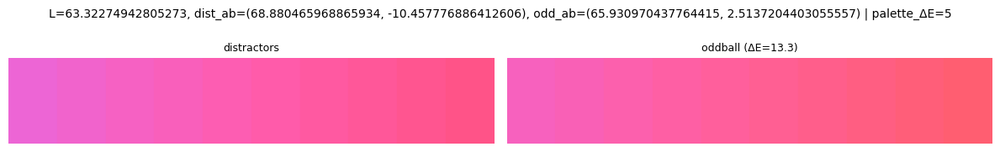

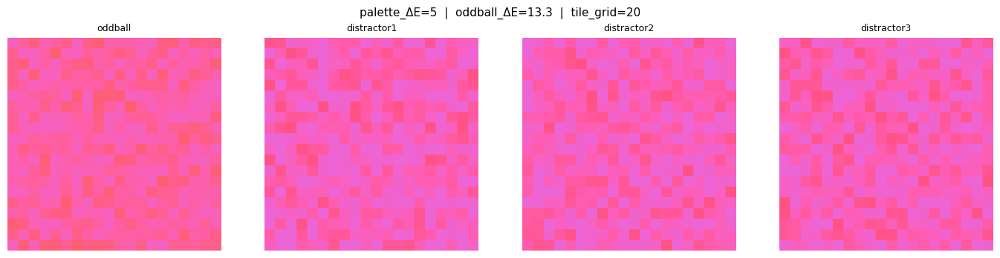

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L63.32274942805273_dist(68.880465968865934, -10.457776886412606)_odd(65.930970437764415, 2.5137204403055557)_pde5_tg20_seed42_*.png]


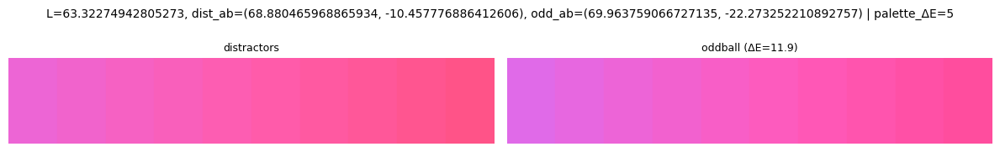

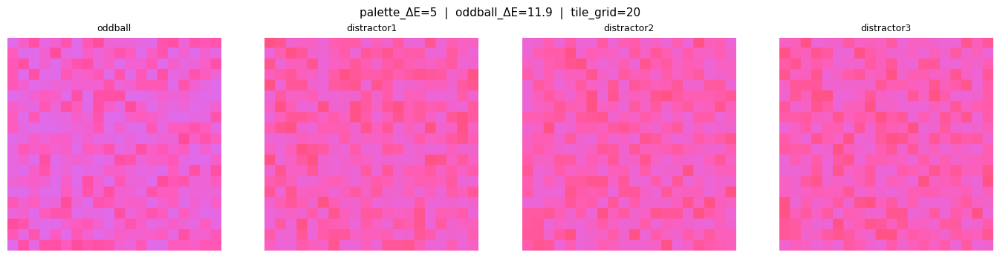

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L63.32274942805273_dist(68.880465968865934, -10.457776886412606)_odd(69.963759066727135, -22.273252210892757)_pde5_tg20_seed42_*.png]


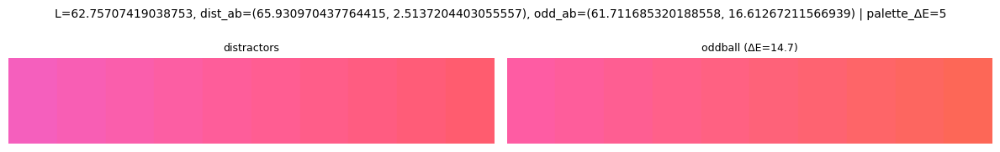

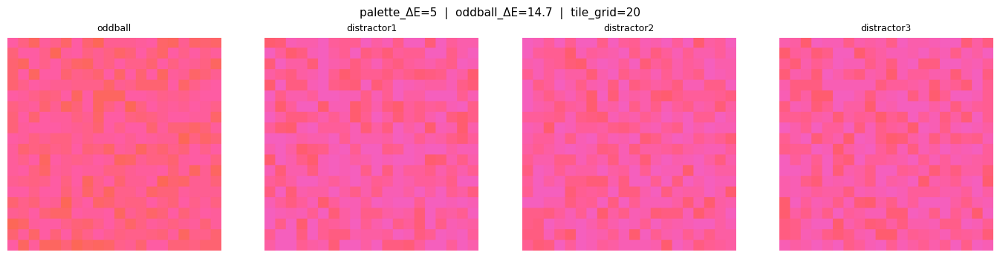

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L62.75707419038753_dist(65.930970437764415, 2.5137204403055557)_odd(61.711685320188558, 16.61267211566939)_pde5_tg20_seed42_*.png]


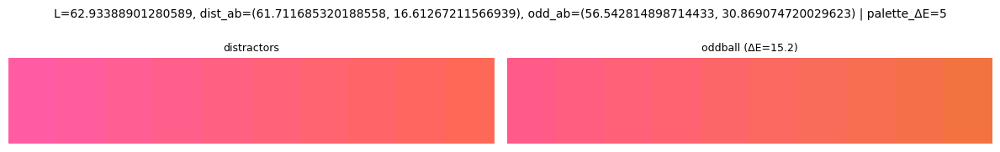

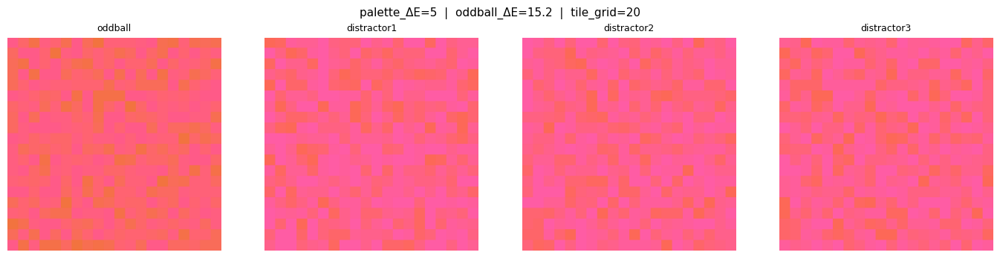

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L62.93388901280589_dist(61.711685320188558, 16.61267211566939)_odd(56.542814898714433, 30.869074720029623)_pde5_tg20_seed42_*.png]


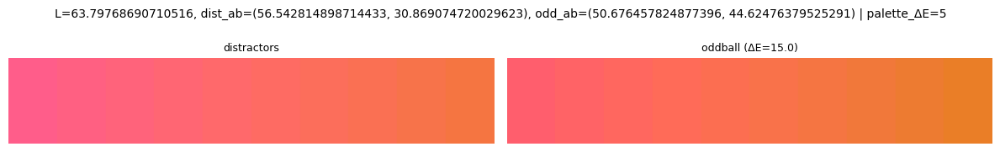

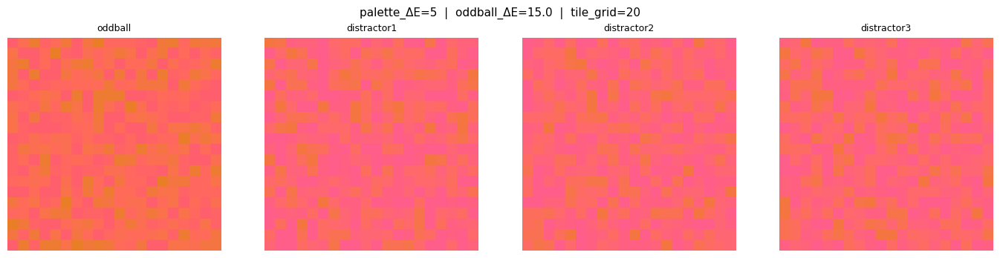

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L63.79768690710516_dist(56.542814898714433, 30.869074720029623)_odd(50.676457824877396, 44.62476379525291)_pde5_tg20_seed42_*.png]


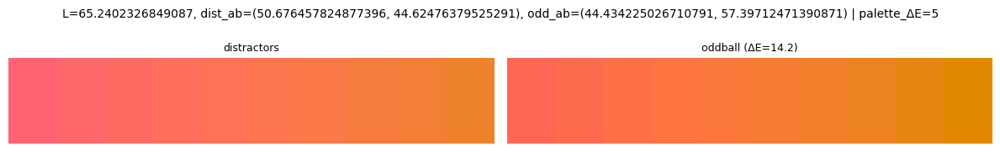

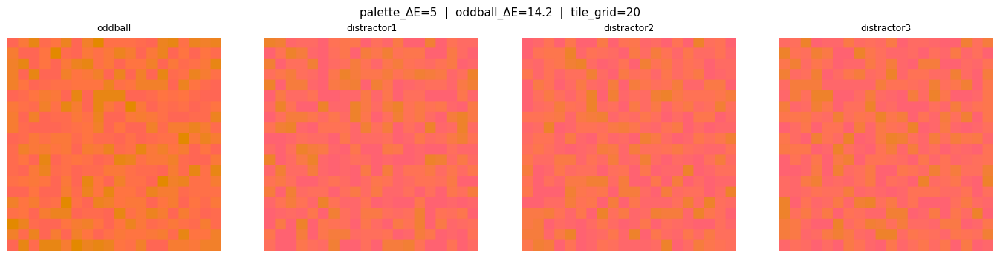

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L65.2402326849087_dist(50.676457824877396, 44.62476379525291)_odd(44.434225026710791, 57.39712471390871)_pde5_tg20_seed42_*.png]


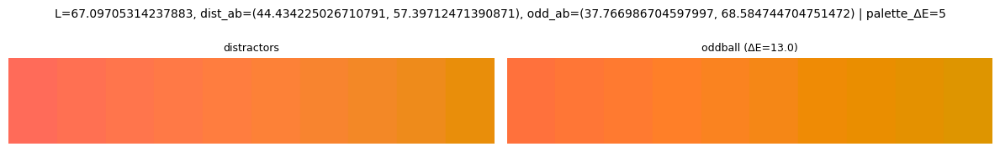

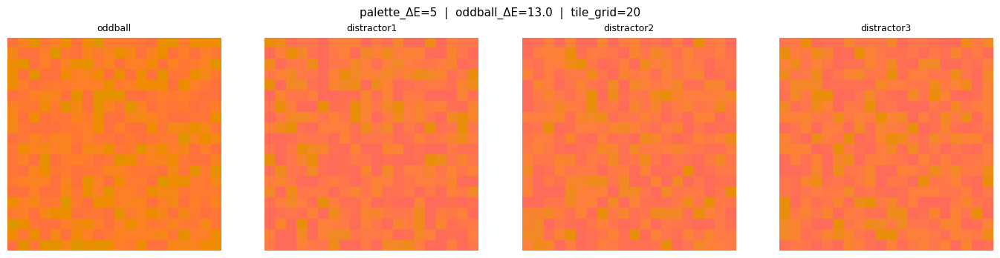

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L67.09705314237883_dist(44.434225026710791, 57.39712471390871)_odd(37.766986704597997, 68.584744704751472)_pde5_tg20_seed42_*.png]


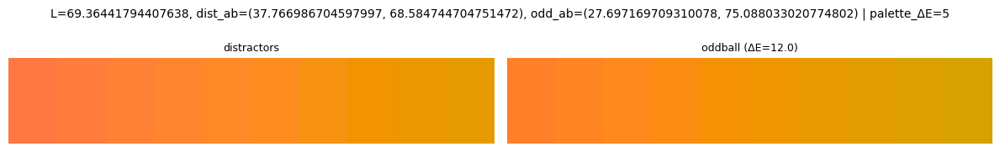

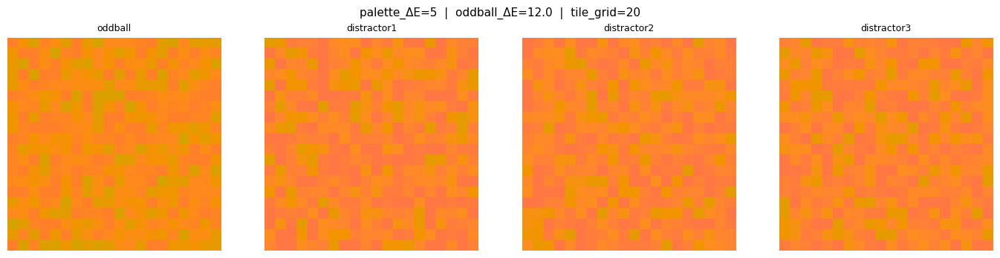

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L69.36441794407638_dist(37.766986704597997, 68.584744704751472)_odd(27.697169709310078, 75.088033020774802)_pde5_tg20_seed42_*.png]


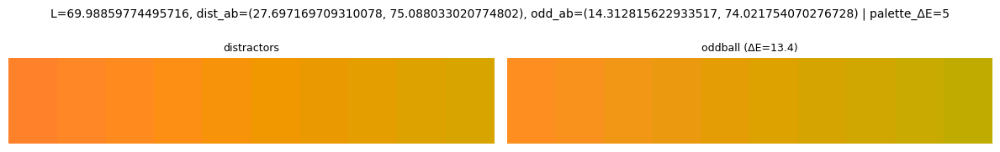

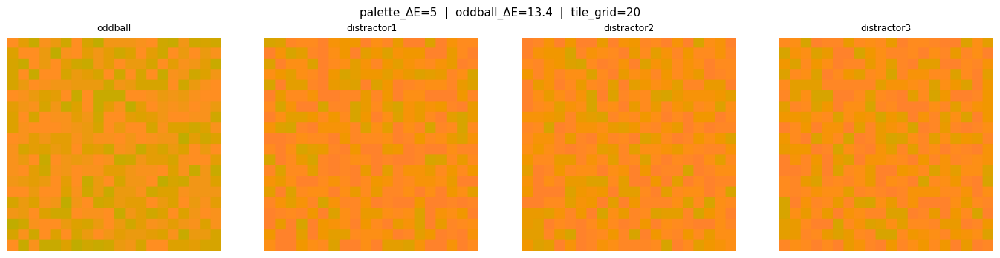

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L69.98859774495716_dist(27.697169709310078, 75.088033020774802)_odd(14.312815622933517, 74.021754070276728)_pde5_tg20_seed42_*.png]


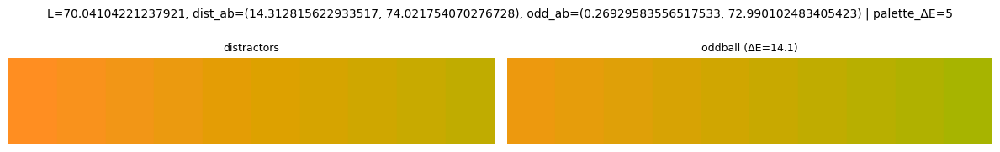

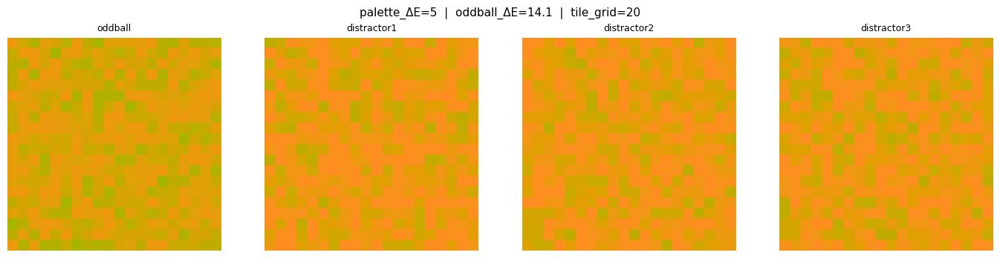

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L70.04104221237921_dist(14.312815622933517, 74.021754070276728)_odd(0.26929583556517533, 72.990102483405423)_pde5_tg20_seed42_*.png]


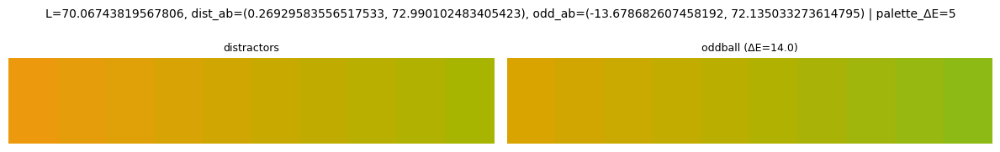

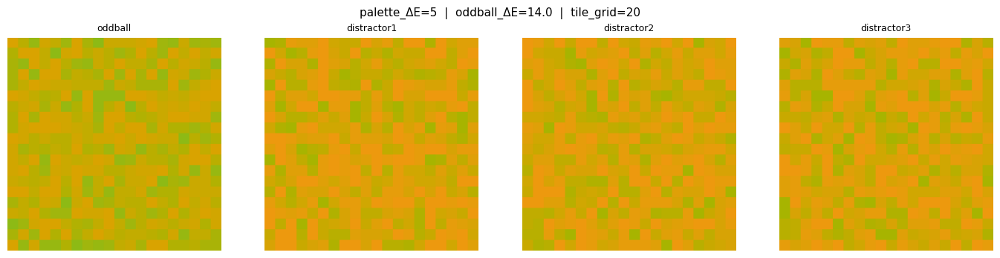

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L70.06743819567806_dist(0.26929583556517533, 72.990102483405423)_odd(-13.678682607458192, 72.135033273614795)_pde5_tg20_seed42_*.png]


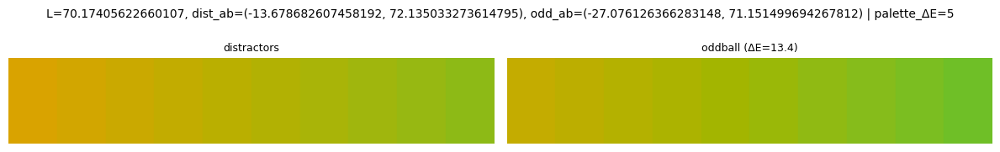

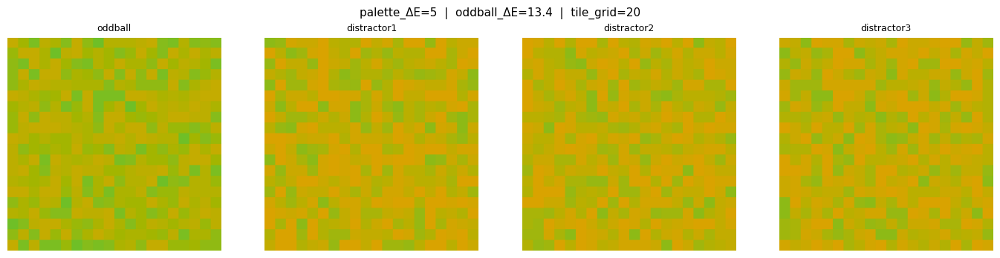

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L70.17405622660107_dist(-13.678682607458192, 72.135033273614795)_odd(-27.076126366283148, 71.151499694267812)_pde5_tg20_seed42_*.png]


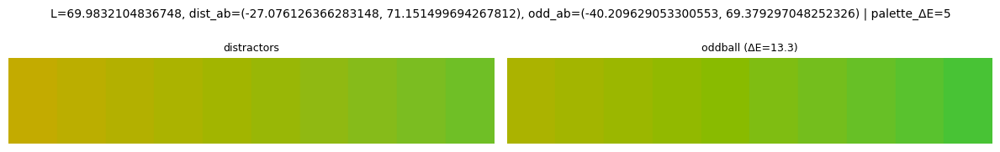

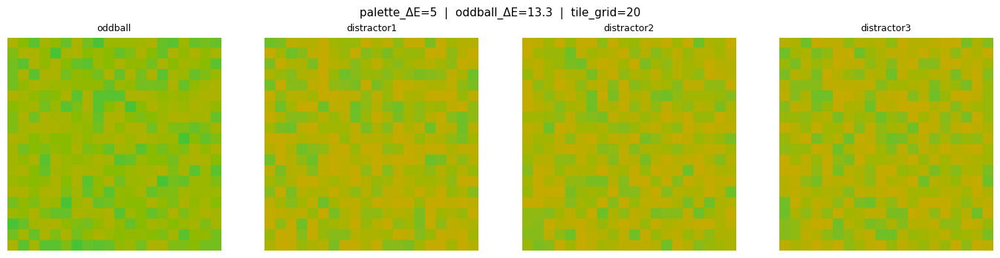

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L69.9832104836748_dist(-27.076126366283148, 71.151499694267812)_odd(-40.209629053300553, 69.379297048252326)_pde5_tg20_seed42_*.png]


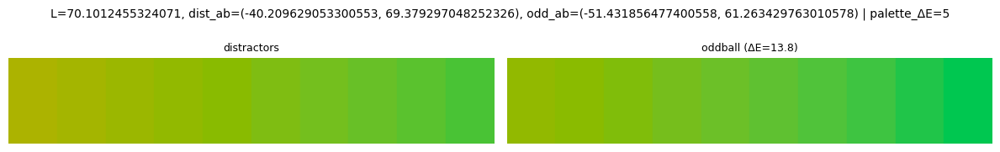

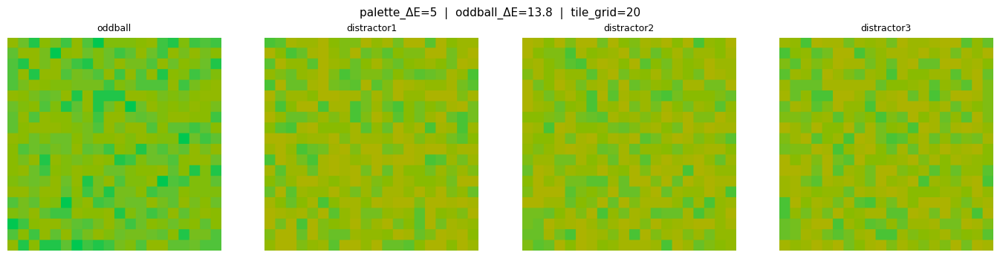

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L70.1012455324071_dist(-40.209629053300553, 69.379297048252326)_odd(-51.431856477400558, 61.263429763010578)_pde5_tg20_seed42_*.png]


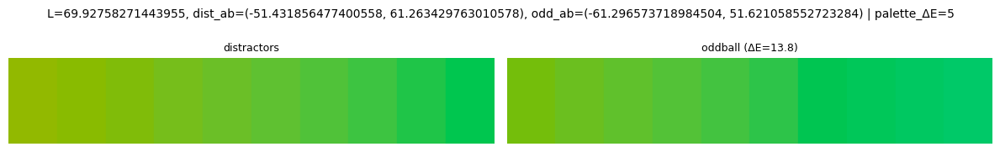

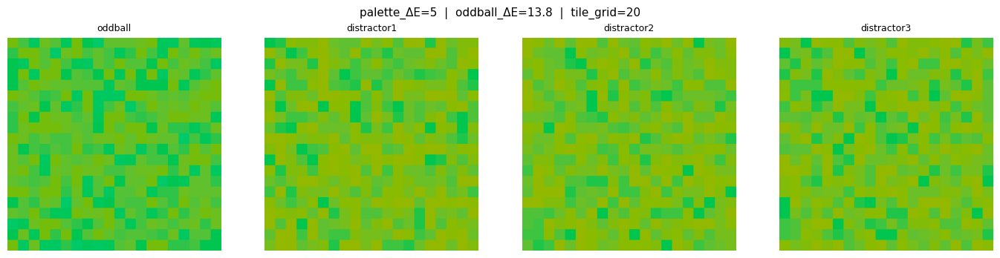

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L69.92758271443955_dist(-51.431856477400558, 61.263429763010578)_odd(-61.296573718984504, 51.621058552723284)_pde5_tg20_seed42_*.png]


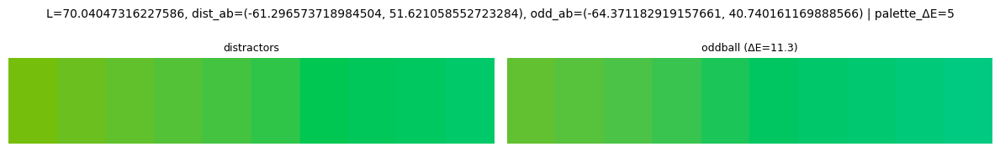

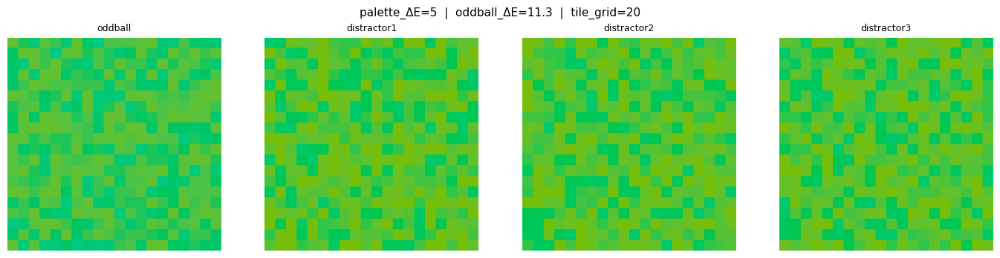

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L70.04047316227586_dist(-61.296573718984504, 51.621058552723284)_odd(-64.371182919157661, 40.740161169888566)_pde5_tg20_seed42_*.png]


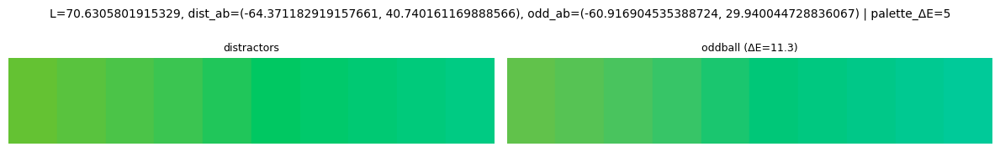

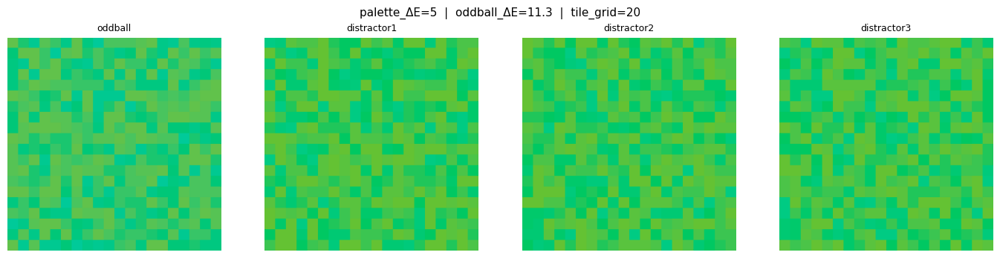

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L70.6305801915329_dist(-64.371182919157661, 40.740161169888566)_odd(-60.916904535388724, 29.940044728836067)_pde5_tg20_seed42_*.png]


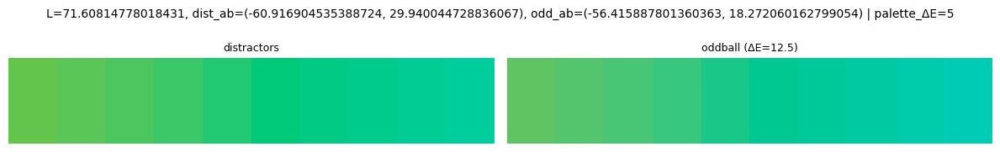

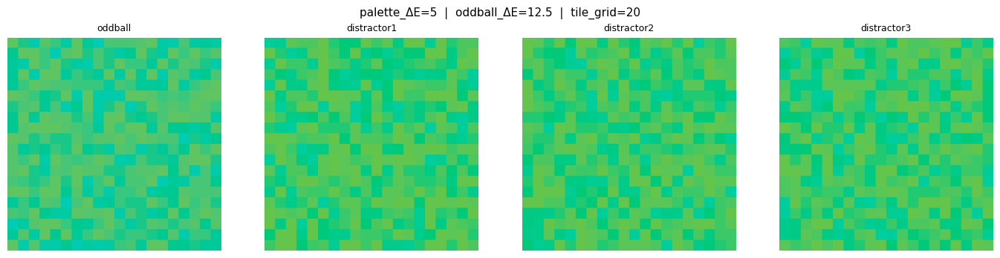

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L71.60814778018431_dist(-60.916904535388724, 29.940044728836067)_odd(-56.415887801360363, 18.272060162799054)_pde5_tg20_seed42_*.png]


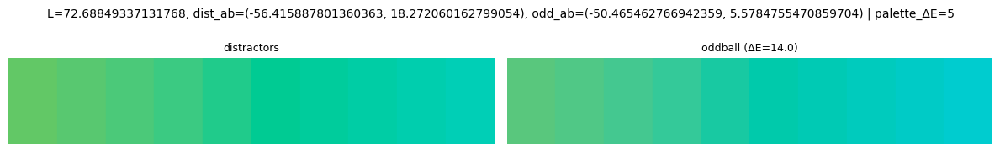

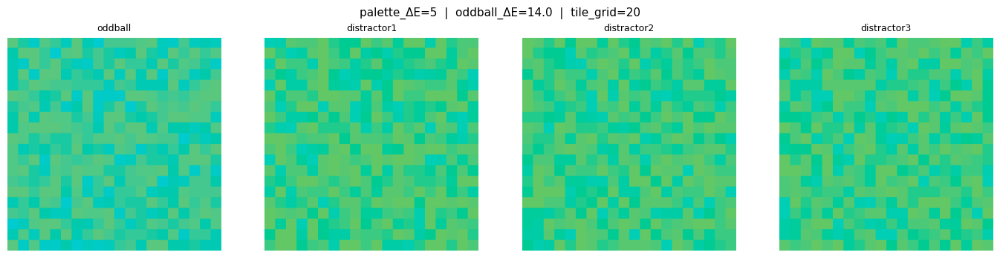

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L72.68849337131768_dist(-56.415887801360363, 18.272060162799054)_odd(-50.465462766942359, 5.5784755470859704)_pde5_tg20_seed42_*.png]


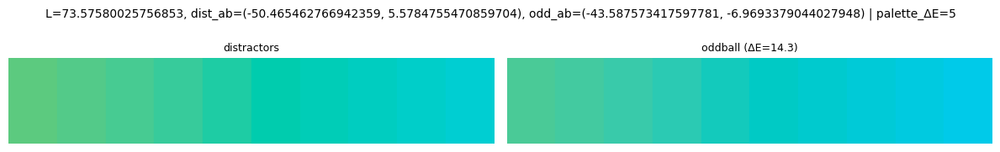

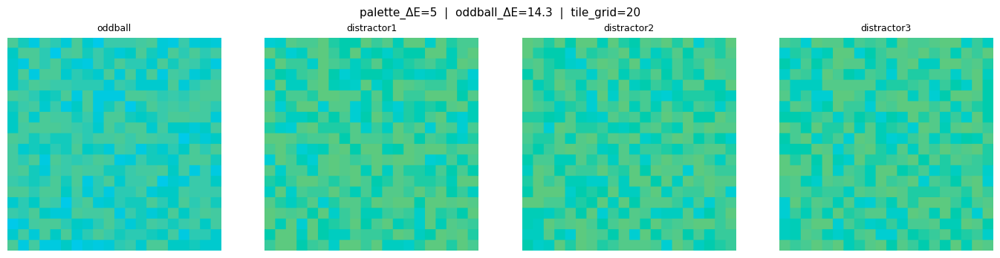

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L73.57580025756853_dist(-50.465462766942359, 5.5784755470859704)_odd(-43.587573417597781, -6.9693379044027948)_pde5_tg20_seed42_*.png]


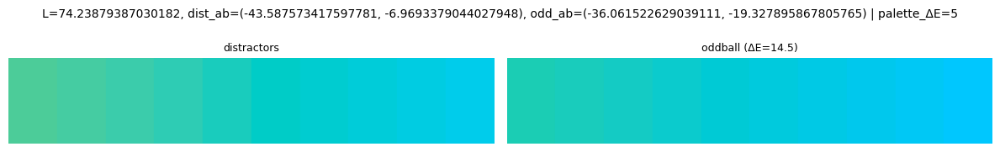

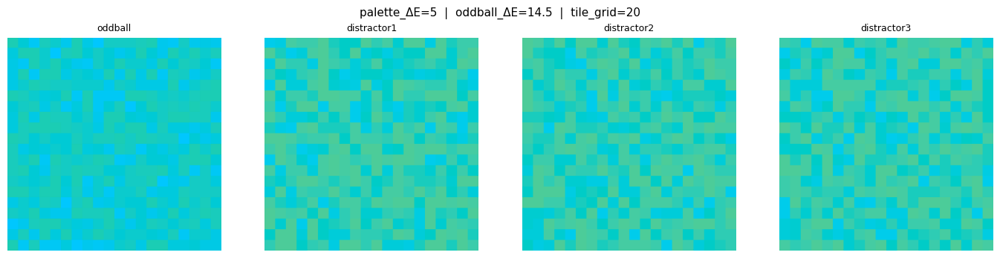

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L74.23879387030182_dist(-43.587573417597781, -6.9693379044027948)_odd(-36.061522629039111, -19.327895867805765)_pde5_tg20_seed42_*.png]


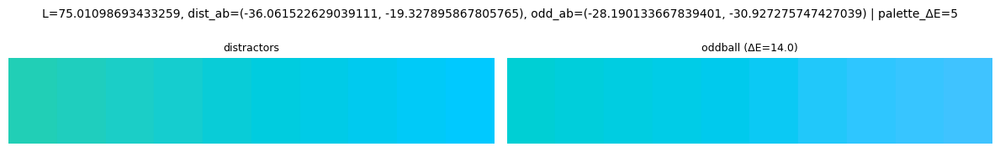

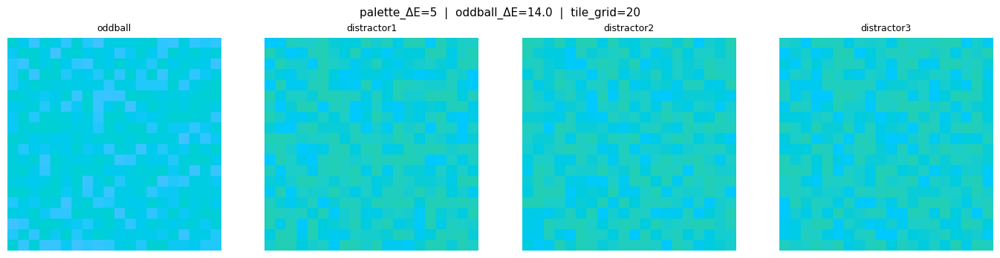

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L75.01098693433259_dist(-36.061522629039111, -19.327895867805765)_odd(-28.190133667839401, -30.927275747427039)_pde5_tg20_seed42_*.png]


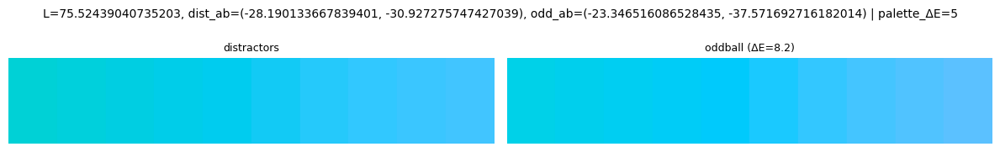

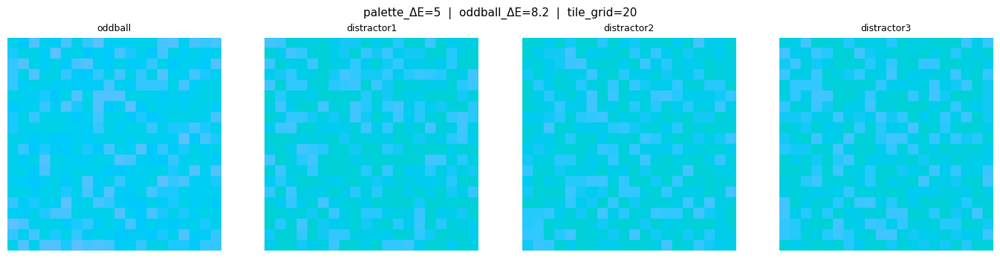

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L75.52439040735203_dist(-28.190133667839401, -30.927275747427039)_odd(-23.346516086528435, -37.571692716182014)_pde5_tg20_seed42_*.png]


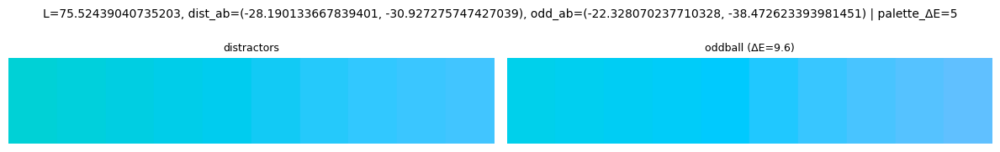

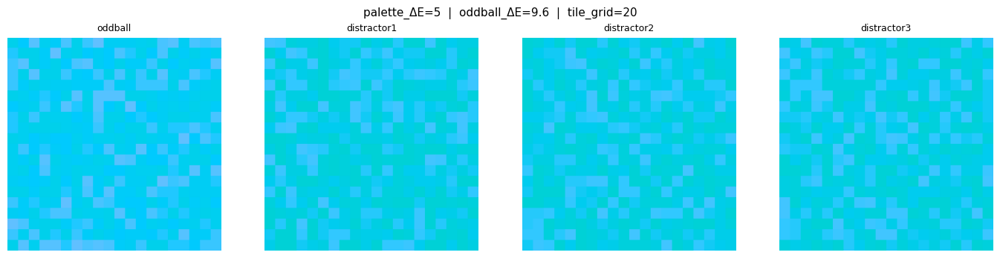

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L75.52439040735203_dist(-28.190133667839401, -30.927275747427039)_odd(-22.328070237710328, -38.472623393981451)_pde5_tg20_seed42_*.png]


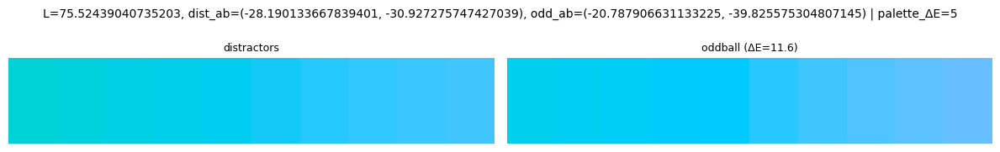

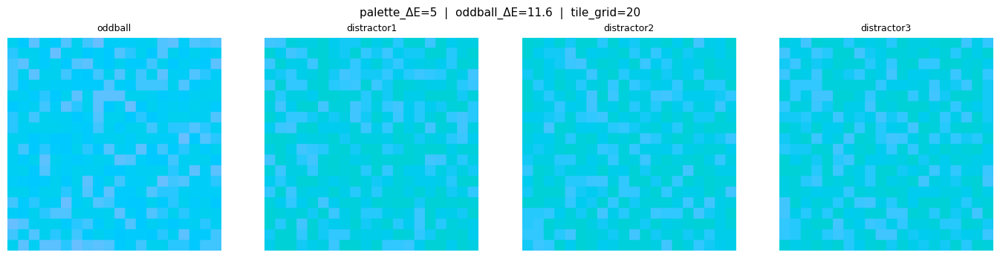

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L75.52439040735203_dist(-28.190133667839401, -30.927275747427039)_odd(-20.787906631133225, -39.825575304807145)_pde5_tg20_seed42_*.png]


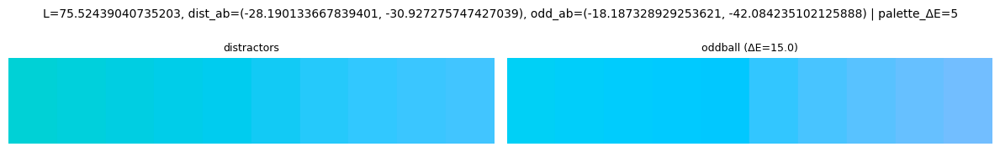

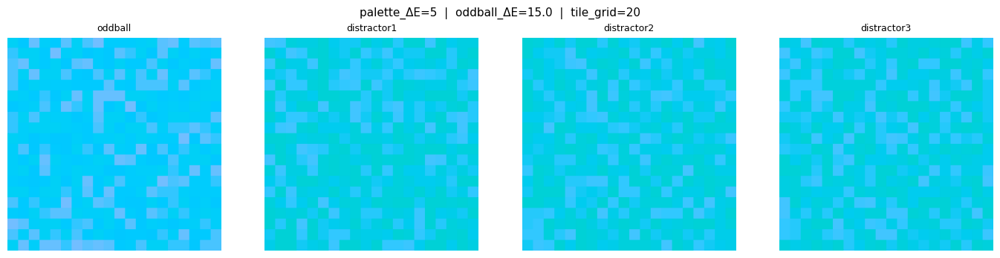

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L75.52439040735203_dist(-28.190133667839401, -30.927275747427039)_odd(-18.187328929253621, -42.084235102125888)_pde5_tg20_seed42_*.png]


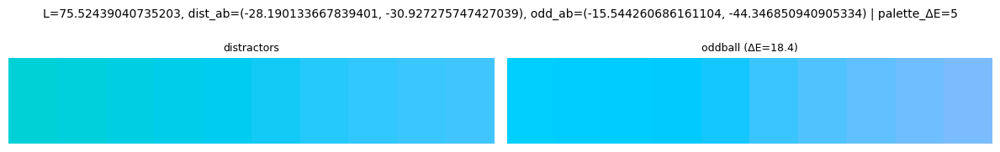

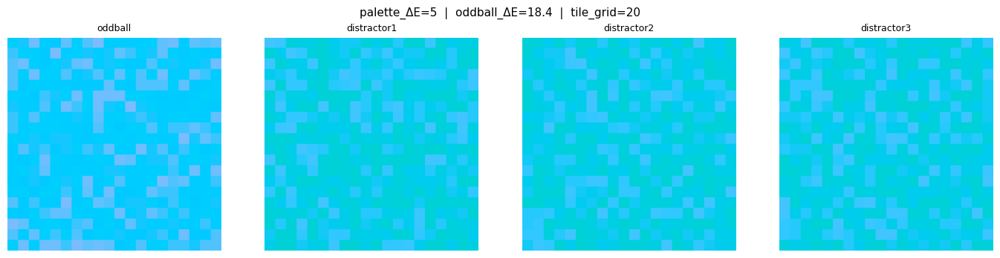

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L75.52439040735203_dist(-28.190133667839401, -30.927275747427039)_odd(-15.544260686161104, -44.346850940905334)_pde5_tg20_seed42_*.png]


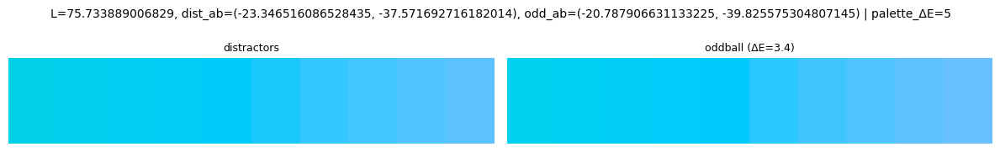

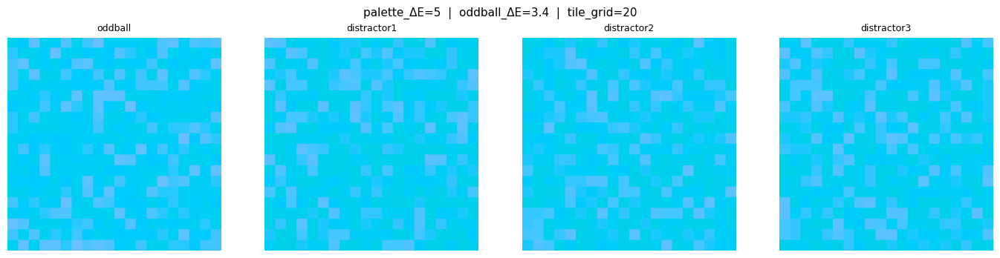

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L75.733889006829_dist(-23.346516086528435, -37.571692716182014)_odd(-20.787906631133225, -39.825575304807145)_pde5_tg20_seed42_*.png]


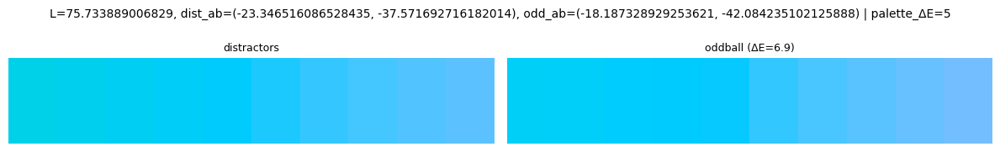

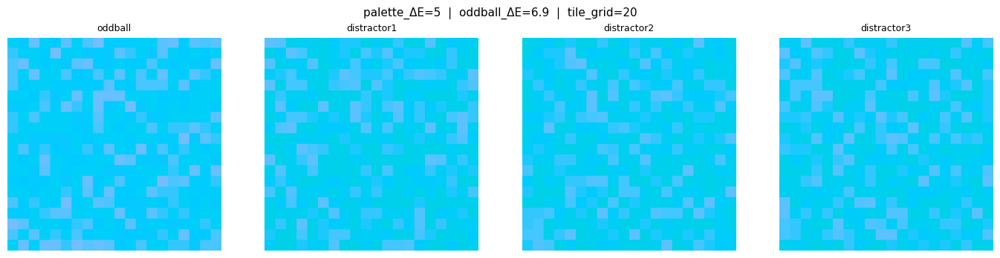

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L75.733889006829_dist(-23.346516086528435, -37.571692716182014)_odd(-18.187328929253621, -42.084235102125888)_pde5_tg20_seed42_*.png]


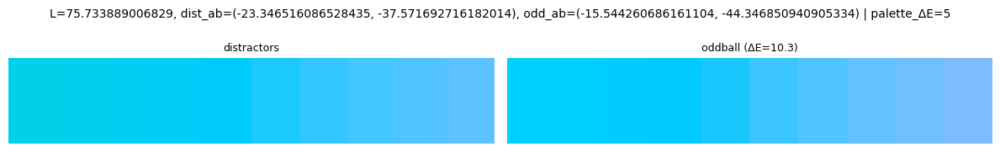

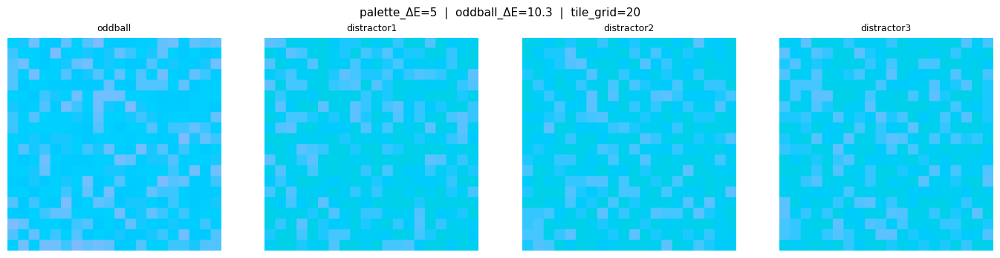

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L75.733889006829_dist(-23.346516086528435, -37.571692716182014)_odd(-15.544260686161104, -44.346850940905334)_pde5_tg20_seed42_*.png]


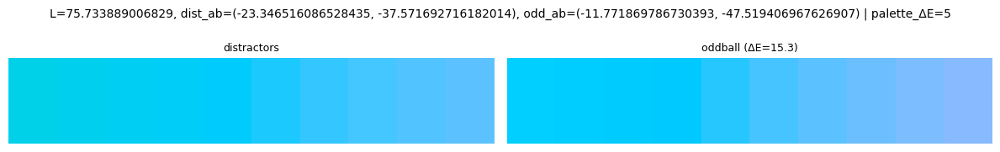

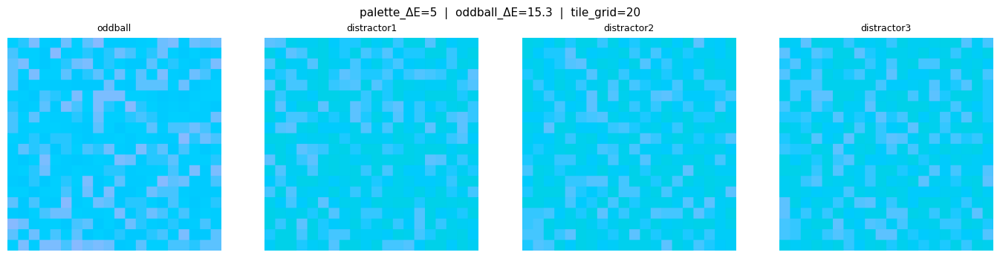

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L75.733889006829_dist(-23.346516086528435, -37.571692716182014)_odd(-11.771869786730393, -47.519406967626907)_pde5_tg20_seed42_*.png]


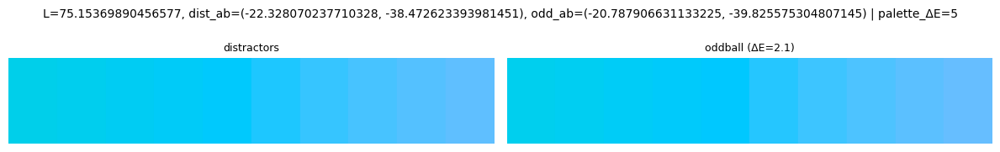

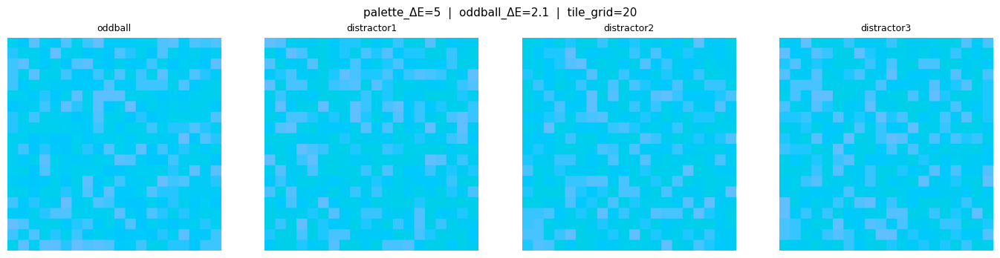

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L75.15369890456577_dist(-22.328070237710328, -38.472623393981451)_odd(-20.787906631133225, -39.825575304807145)_pde5_tg20_seed42_*.png]


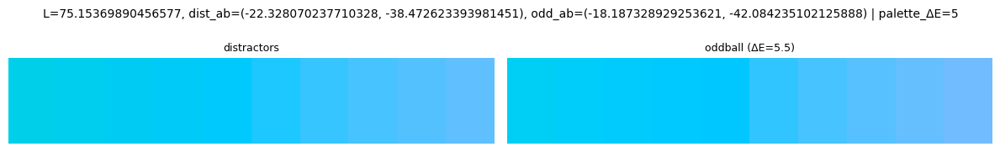

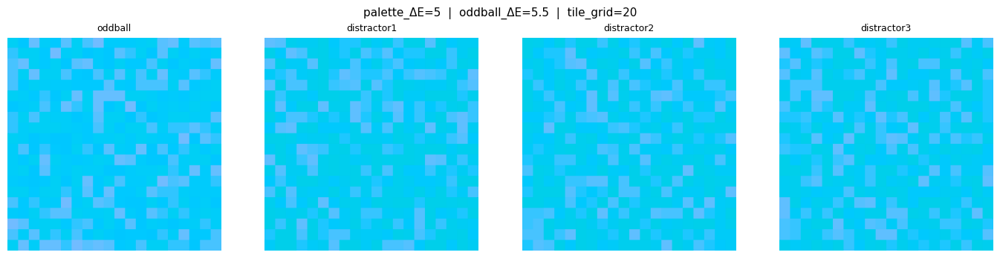

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L75.15369890456577_dist(-22.328070237710328, -38.472623393981451)_odd(-18.187328929253621, -42.084235102125888)_pde5_tg20_seed42_*.png]


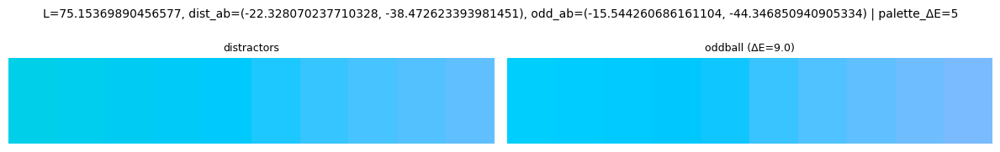

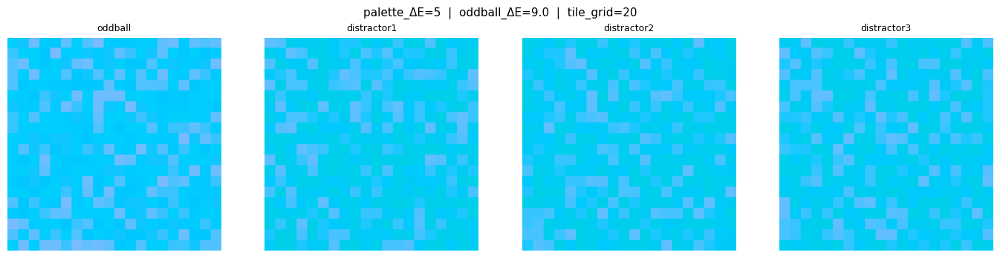

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L75.15369890456577_dist(-22.328070237710328, -38.472623393981451)_odd(-15.544260686161104, -44.346850940905334)_pde5_tg20_seed42_*.png]


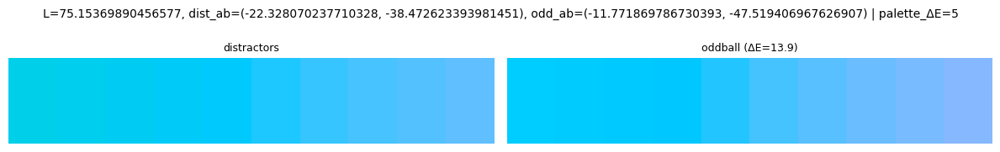

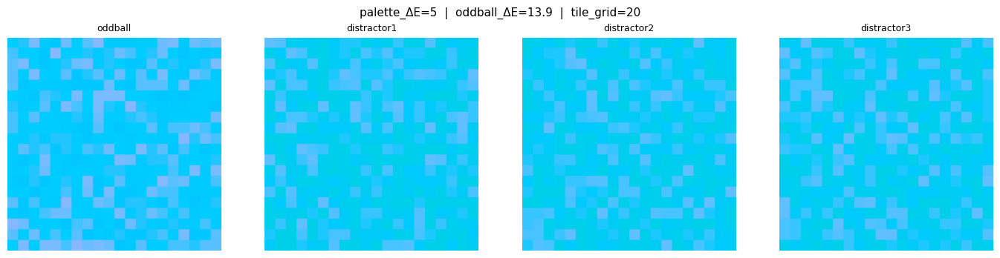

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L75.15369890456577_dist(-22.328070237710328, -38.472623393981451)_odd(-11.771869786730393, -47.519406967626907)_pde5_tg20_seed42_*.png]


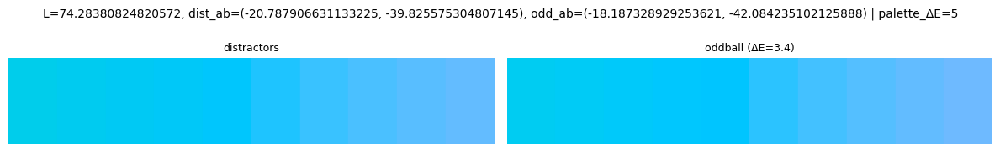

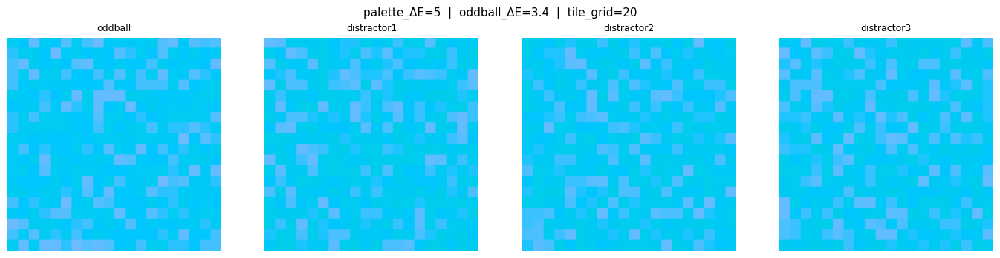

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L74.28380824820572_dist(-20.787906631133225, -39.825575304807145)_odd(-18.187328929253621, -42.084235102125888)_pde5_tg20_seed42_*.png]


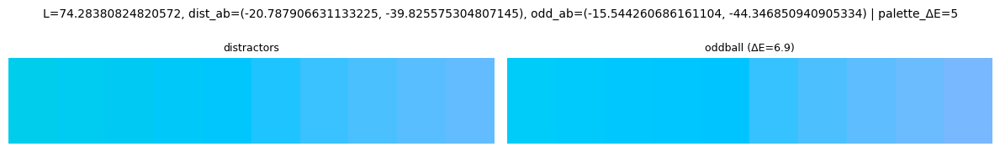

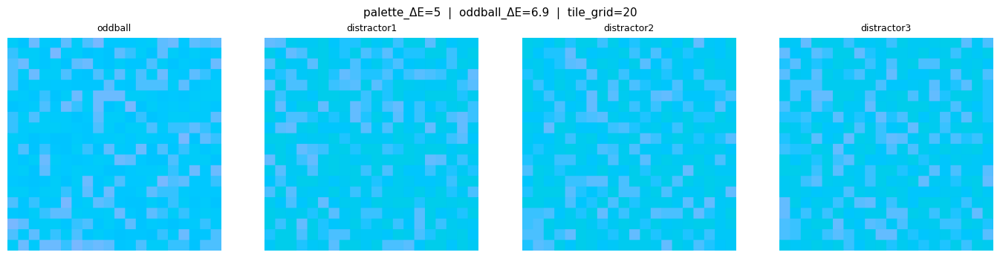

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L74.28380824820572_dist(-20.787906631133225, -39.825575304807145)_odd(-15.544260686161104, -44.346850940905334)_pde5_tg20_seed42_*.png]


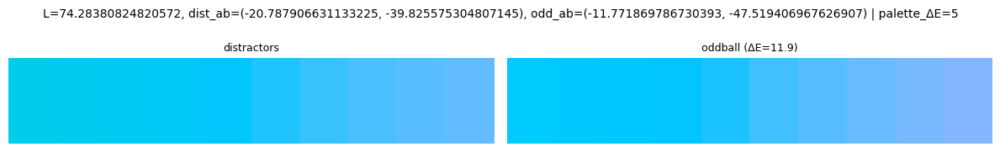

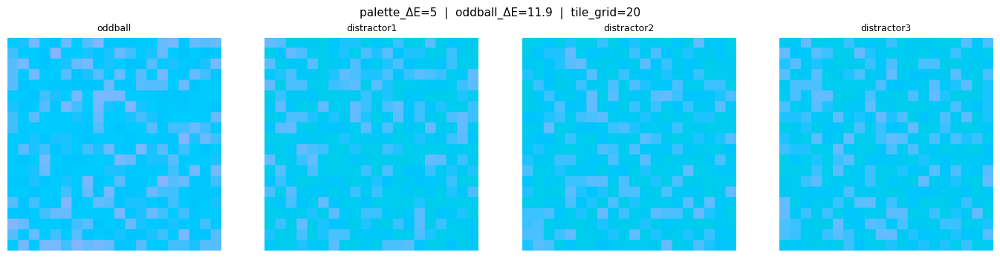

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L74.28380824820572_dist(-20.787906631133225, -39.825575304807145)_odd(-11.771869786730393, -47.519406967626907)_pde5_tg20_seed42_*.png]


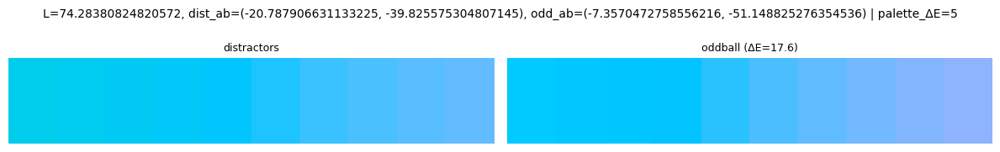

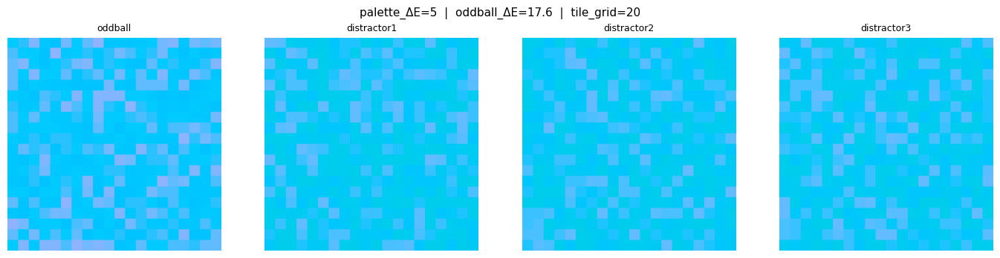

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L74.28380824820572_dist(-20.787906631133225, -39.825575304807145)_odd(-7.3570472758556216, -51.148825276354536)_pde5_tg20_seed42_*.png]


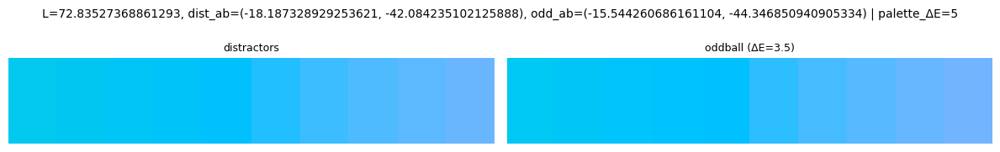

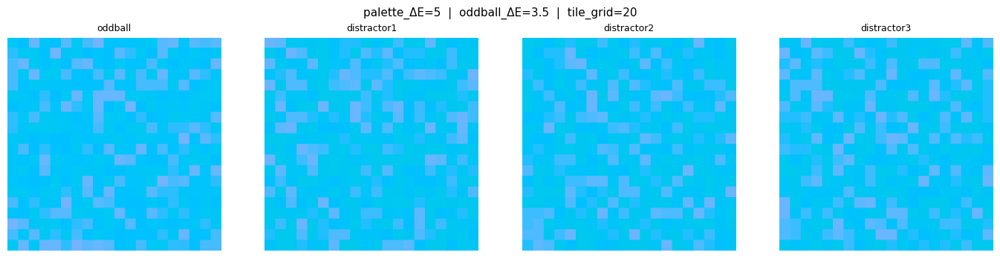

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L72.83527368861293_dist(-18.187328929253621, -42.084235102125888)_odd(-15.544260686161104, -44.346850940905334)_pde5_tg20_seed42_*.png]


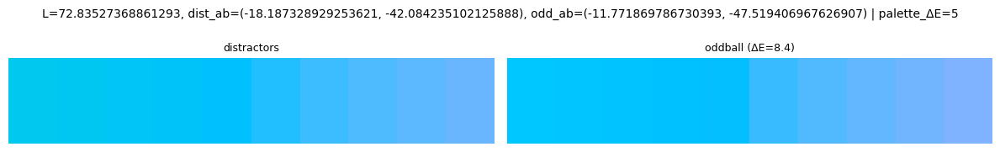

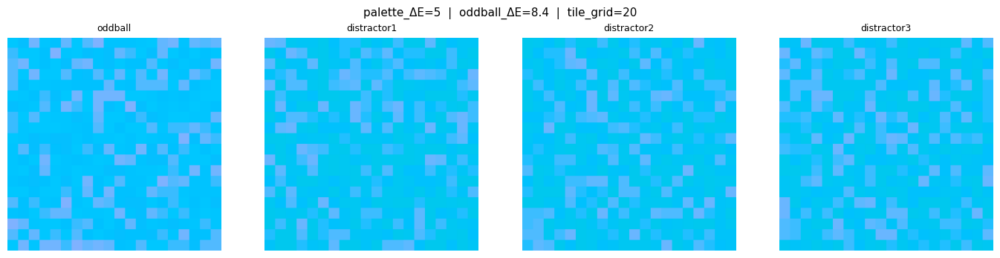

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L72.83527368861293_dist(-18.187328929253621, -42.084235102125888)_odd(-11.771869786730393, -47.519406967626907)_pde5_tg20_seed42_*.png]


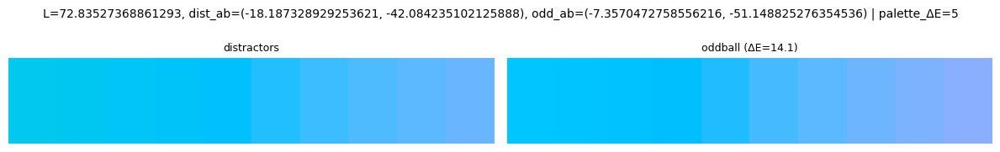

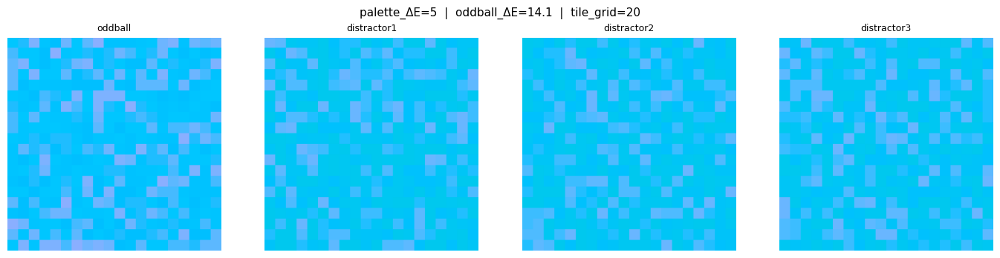

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L72.83527368861293_dist(-18.187328929253621, -42.084235102125888)_odd(-7.3570472758556216, -51.148825276354536)_pde5_tg20_seed42_*.png]


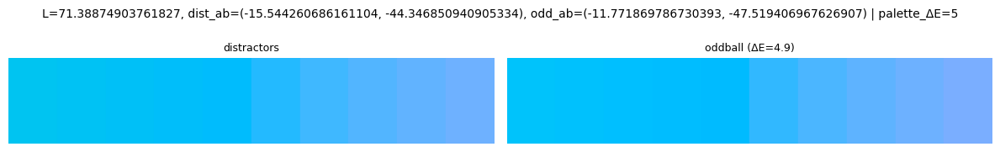

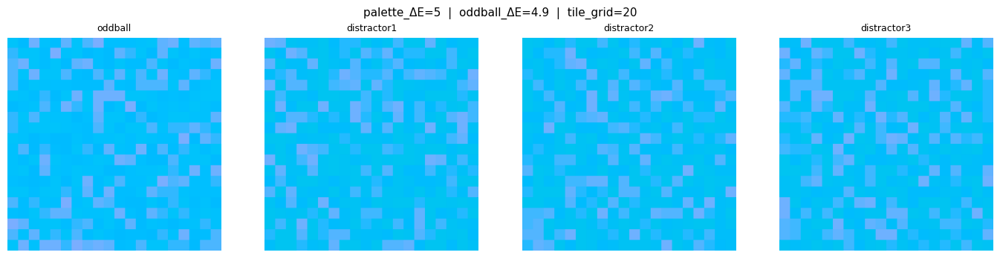

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L71.38874903761827_dist(-15.544260686161104, -44.346850940905334)_odd(-11.771869786730393, -47.519406967626907)_pde5_tg20_seed42_*.png]


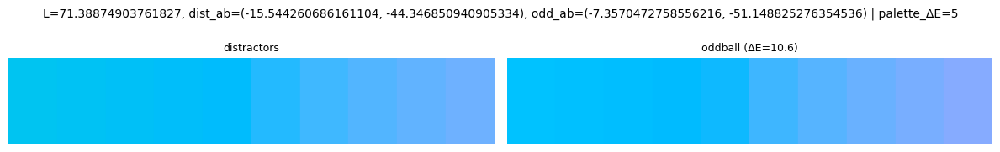

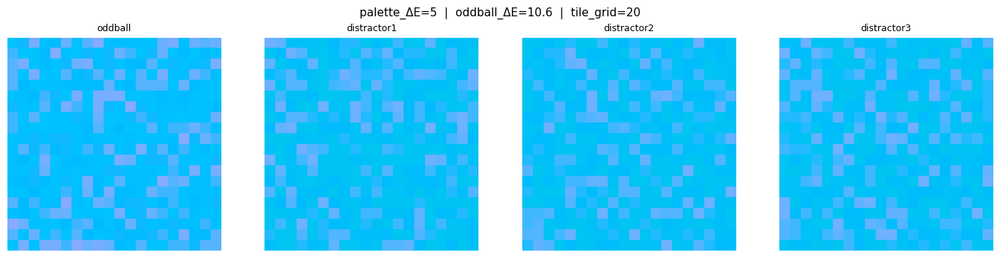

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L71.38874903761827_dist(-15.544260686161104, -44.346850940905334)_odd(-7.3570472758556216, -51.148825276354536)_pde5_tg20_seed42_*.png]


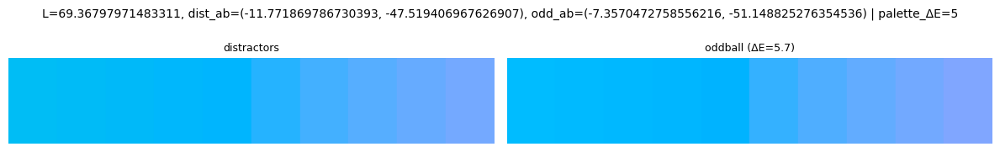

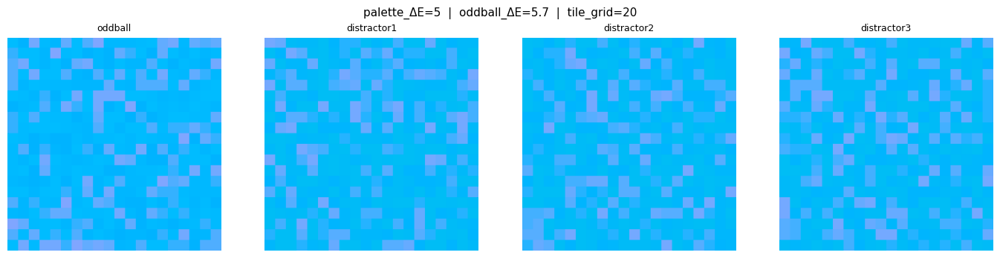

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L69.36797971483311_dist(-11.771869786730393, -47.519406967626907)_odd(-7.3570472758556216, -51.148825276354536)_pde5_tg20_seed42_*.png]


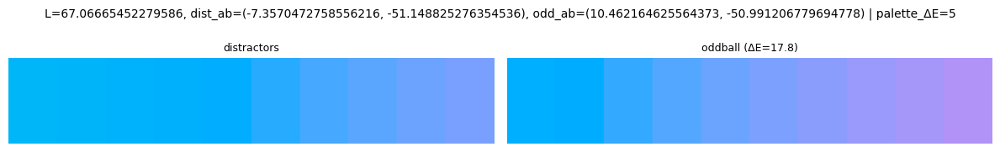

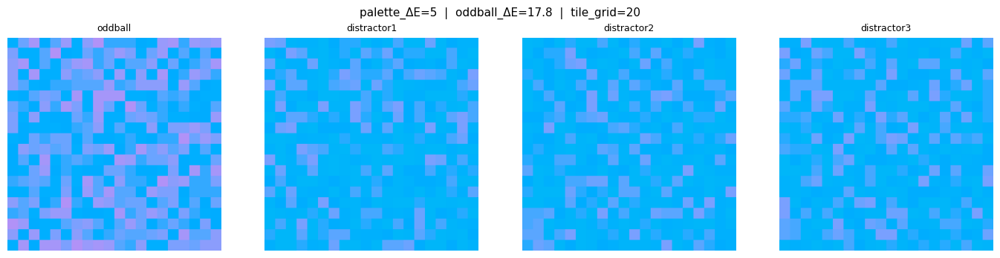

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L67.06665452279586_dist(-7.3570472758556216, -51.148825276354536)_odd(10.462164625564373, -50.991206779694778)_pde5_tg20_seed42_*.png]


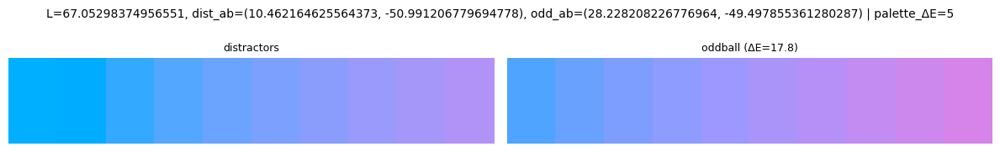

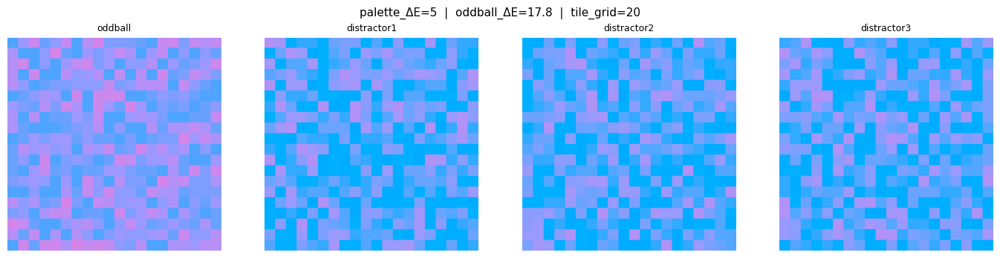

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L67.05298374956551_dist(10.462164625564373, -50.991206779694778)_odd(28.228208226776964, -49.497855361280287)_pde5_tg20_seed42_*.png]


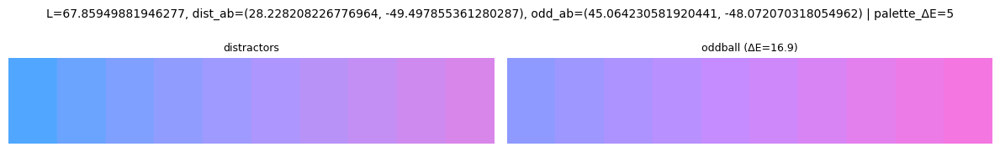

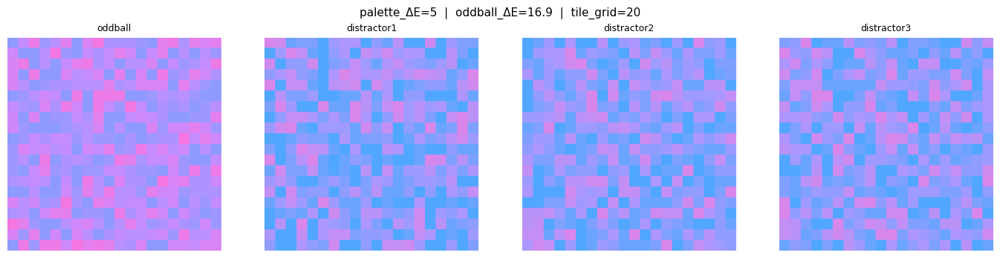

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L67.85949881946277_dist(28.228208226776964, -49.497855361280287)_odd(45.064230581920441, -48.072070318054962)_pde5_tg20_seed42_*.png]


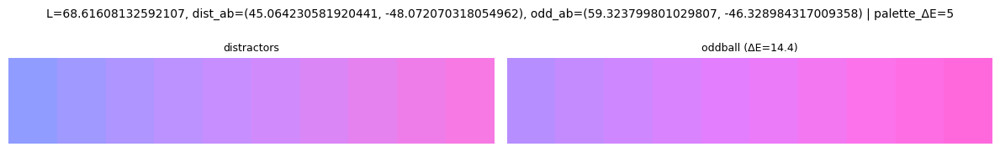

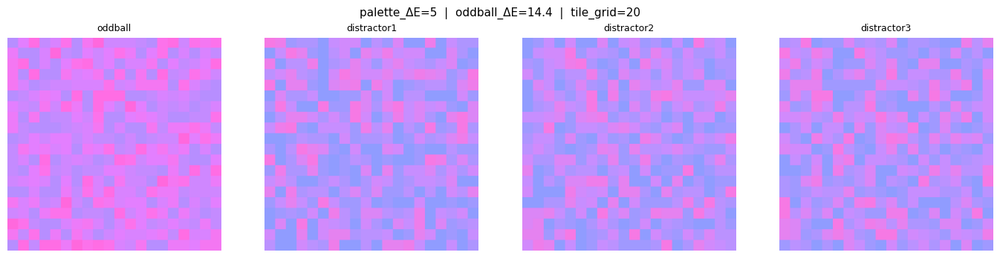

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L68.61608132592107_dist(45.064230581920441, -48.072070318054962)_odd(59.323799801029807, -46.328984317009358)_pde5_tg20_seed42_*.png]


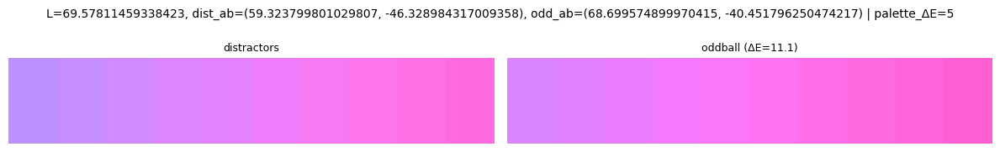

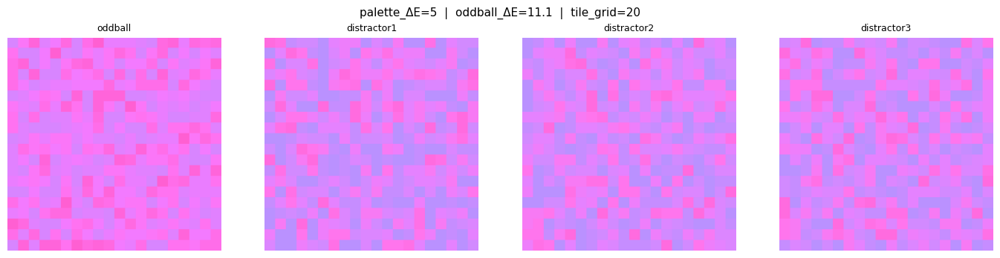

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L69.57811459338423_dist(59.323799801029807, -46.328984317009358)_odd(68.699574899970415, -40.451796250474217)_pde5_tg20_seed42_*.png]


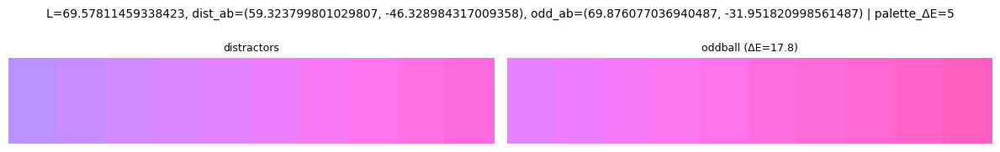

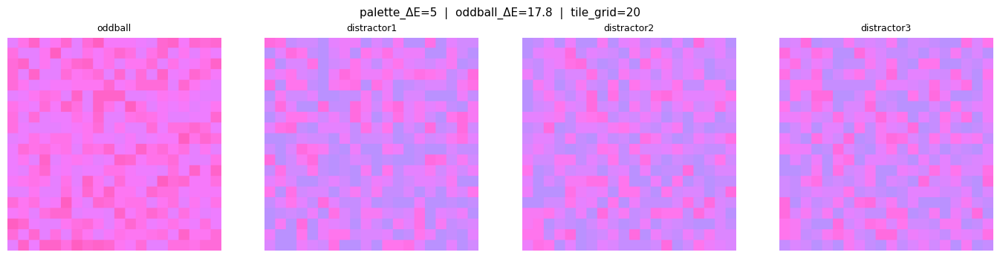

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L69.57811459338423_dist(59.323799801029807, -46.328984317009358)_odd(69.876077036940487, -31.951820998561487)_pde5_tg20_seed42_*.png]


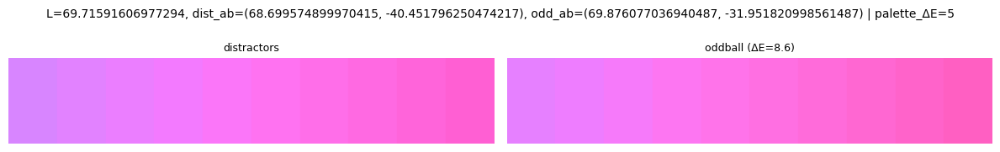

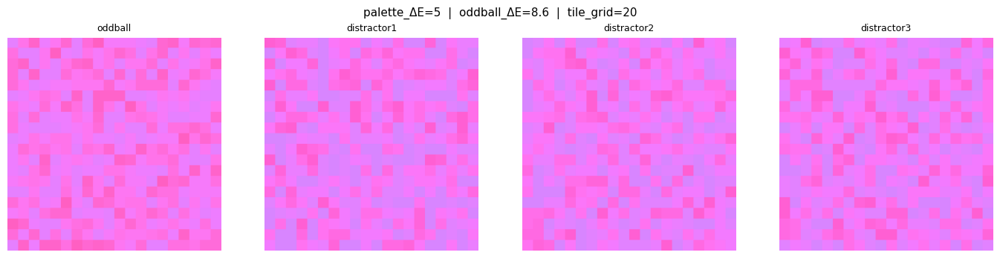

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L69.71591606977294_dist(68.699574899970415, -40.451796250474217)_odd(69.876077036940487, -31.951820998561487)_pde5_tg20_seed42_*.png]


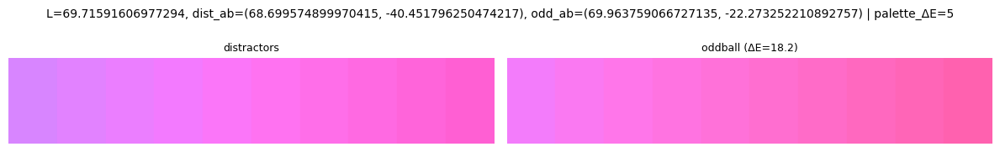

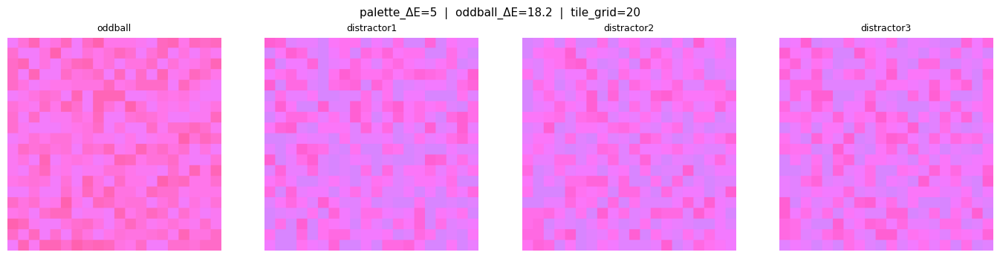

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L69.71591606977294_dist(68.699574899970415, -40.451796250474217)_odd(69.963759066727135, -22.273252210892757)_pde5_tg20_seed42_*.png]


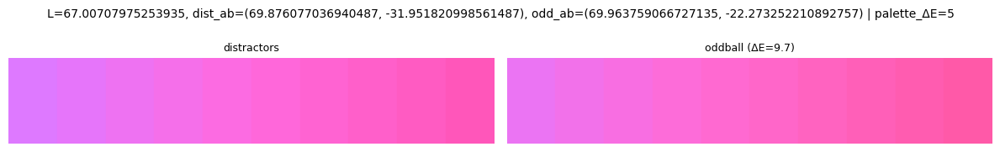

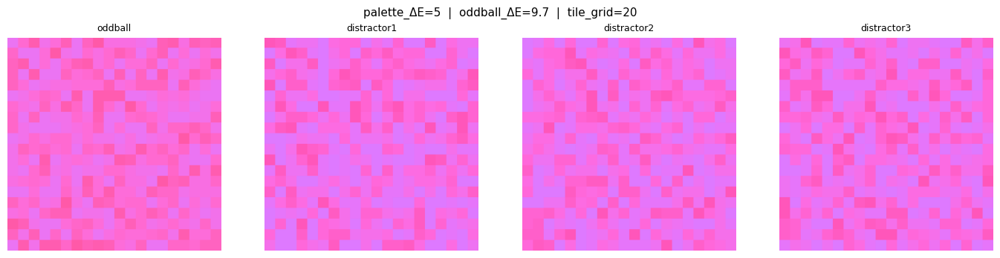

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L70/  [L67.00707975253935_dist(69.876077036940487, -31.951820998561487)_odd(69.963759066727135, -22.273252210892757)_pde5_tg20_seed42_*.png]
Saved → /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/trial_gallery_L70.html


In [16]:
# ── HTML + PNG export workflow ────────────────────────────────────────────────
# Collect trials from a ring, export as a shareable HTML file AND individual PNGs.
# Oddball is always first in each set.

ring  = generate_hue_ring(L=70, C=80, n_colors=36, offset_deg=0)
pairs = select_pairs(ring, min_de=2, max_de=20)
lab   = rgb2lab(ring.reshape(1, -1, 3).astype(np.float64) / 255.0)[0]

png_dir  = os.path.join(export_folder, "pngs_L70")    # folder for individual PNGs
html_out = os.path.join(export_folder, "trial_gallery_L70.html")

trial_sets = []
for i, j in pairs:
    dist_ab = (lab[i, 1], lab[i, 2])
    odd_ab  = (lab[j, 1], lab[j, 2])
    de      = np.sqrt((dist_ab[0] - odd_ab[0])**2 + (dist_ab[1] - odd_ab[1])**2)

    bitmaps = make_trial_from_pair(
        L          = lab[i, 0],
        dist_ab    = dist_ab,
        odd_ab     = odd_ab,
        palette_de = 5,
        n_shades   = 10,
        seed       = 42,
        export_dir = png_dir,     # saves 4 PNGs per trial
    )
    trial_sets.append({
        "bitmaps": bitmaps,
        "title": f"dist=({dist_ab[0]:.1f}, {dist_ab[1]:.1f})  "
                 f"odd=({odd_ab[0]:.1f}, {odd_ab[1]:.1f})  ΔE={de:.1f}"
    })

export_html(trial_sets, output_path=html_out)


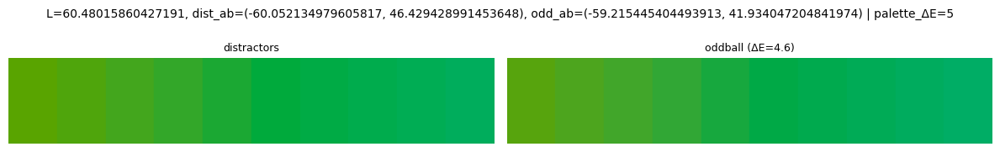

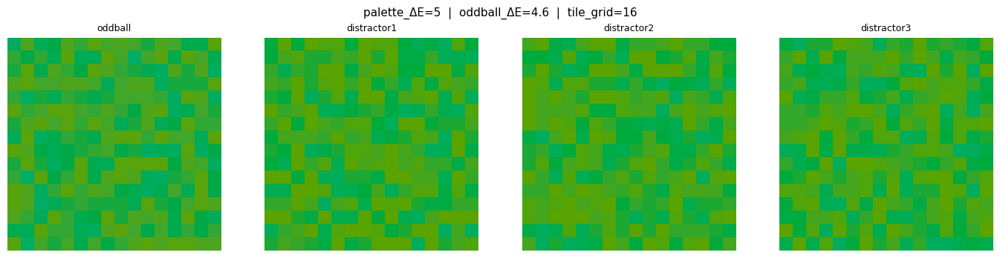

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L60.48015860427191_dist(-60.052134979605817, 46.429428991453648)_odd(-59.215445404493913, 41.934047204841974)_pde5_tg16_seed42_*.png]


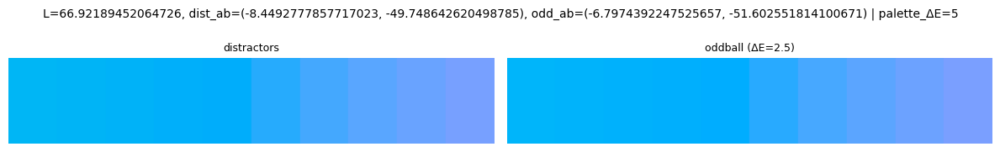

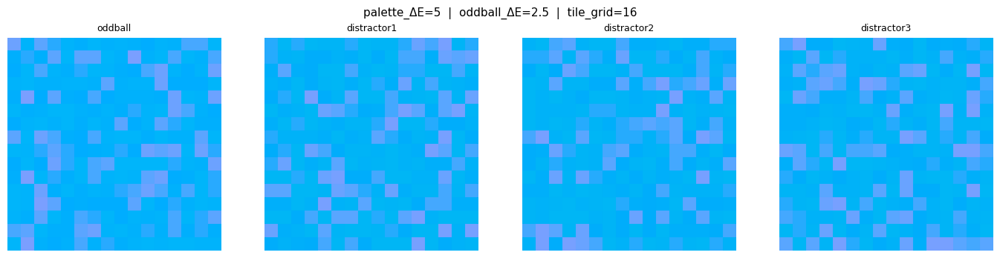

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L66.92189452064726_dist(-8.4492777857717023, -49.748642620498785)_odd(-6.7974392247525657, -51.602551814100671)_pde5_tg16_seed42_*.png]


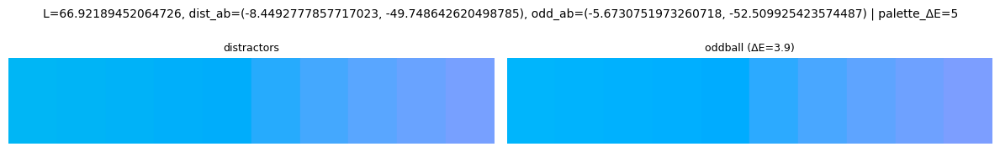

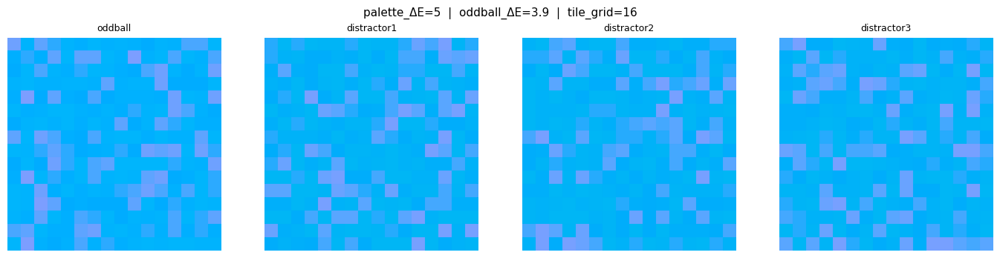

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L66.92189452064726_dist(-8.4492777857717023, -49.748642620498785)_odd(-5.6730751973260718, -52.509925423574487)_pde5_tg16_seed42_*.png]


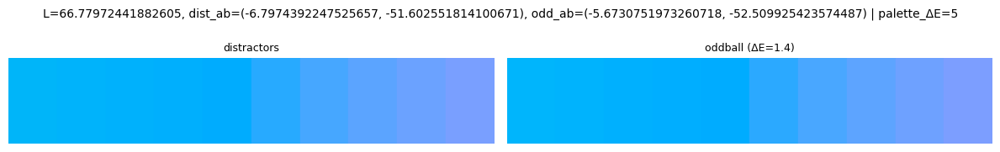

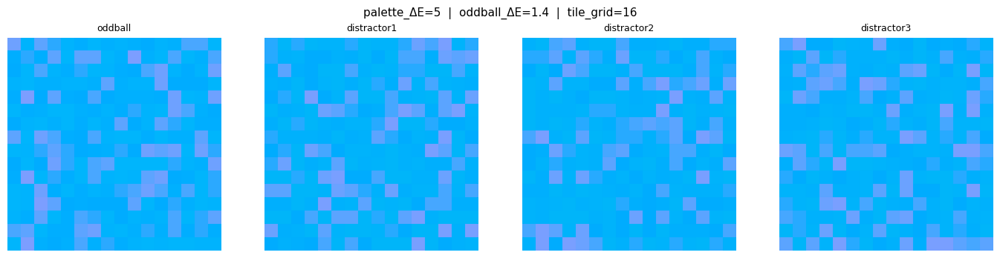

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L66.77972441882605_dist(-6.7974392247525657, -51.602551814100671)_odd(-5.6730751973260718, -52.509925423574487)_pde5_tg16_seed42_*.png]


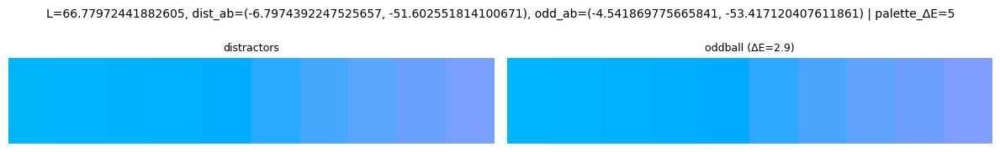

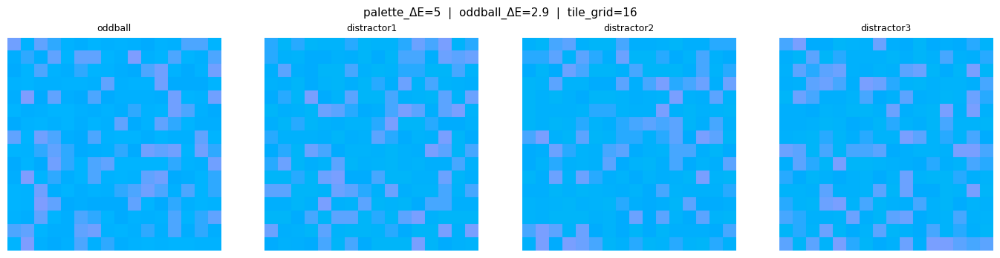

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L66.77972441882605_dist(-6.7974392247525657, -51.602551814100671)_odd(-4.541869775665841, -53.417120407611861)_pde5_tg16_seed42_*.png]


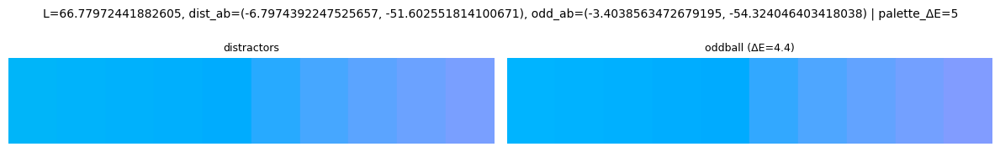

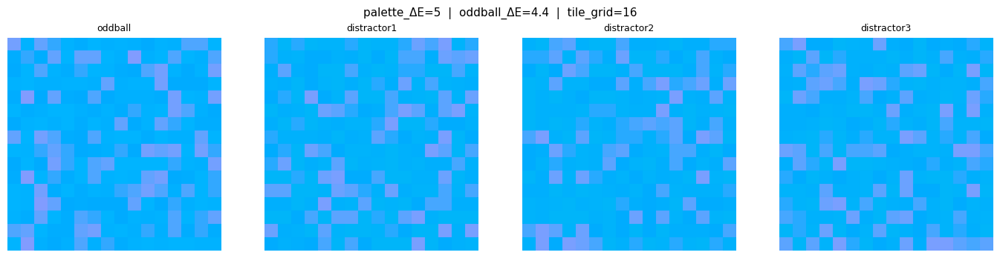

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L66.77972441882605_dist(-6.7974392247525657, -51.602551814100671)_odd(-3.4038563472679195, -54.324046403418038)_pde5_tg16_seed42_*.png]


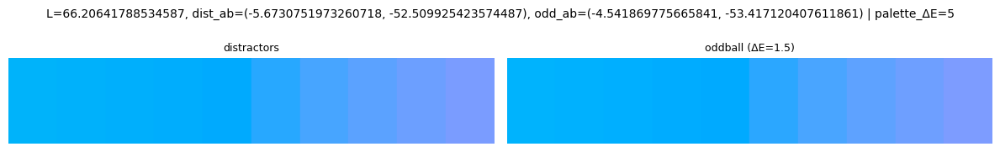

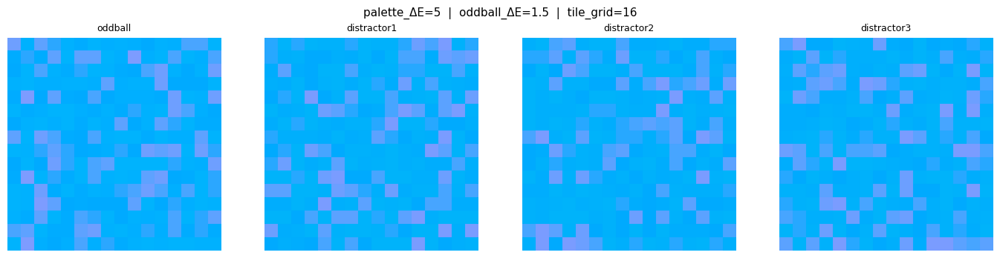

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L66.20641788534587_dist(-5.6730751973260718, -52.509925423574487)_odd(-4.541869775665841, -53.417120407611861)_pde5_tg16_seed42_*.png]


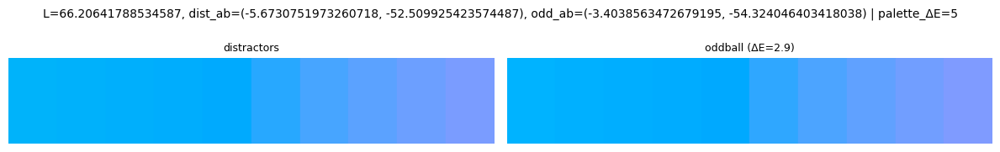

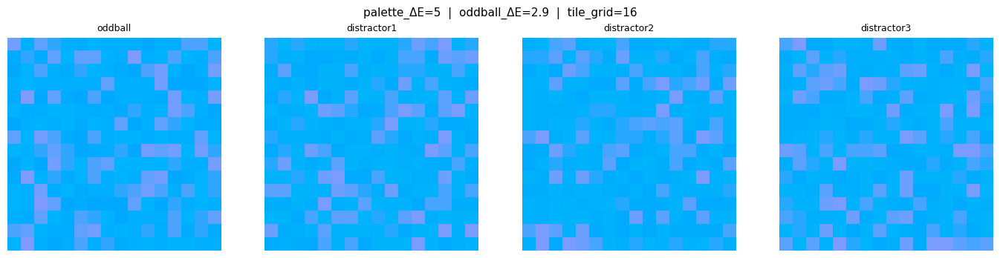

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L66.20641788534587_dist(-5.6730751973260718, -52.509925423574487)_odd(-3.4038563472679195, -54.324046403418038)_pde5_tg16_seed42_*.png]


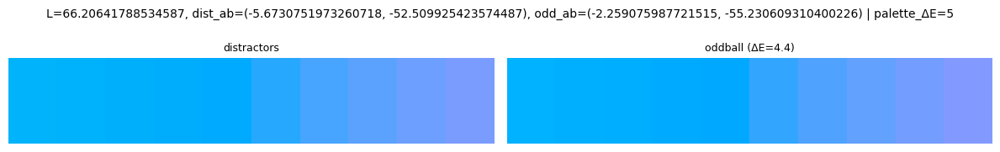

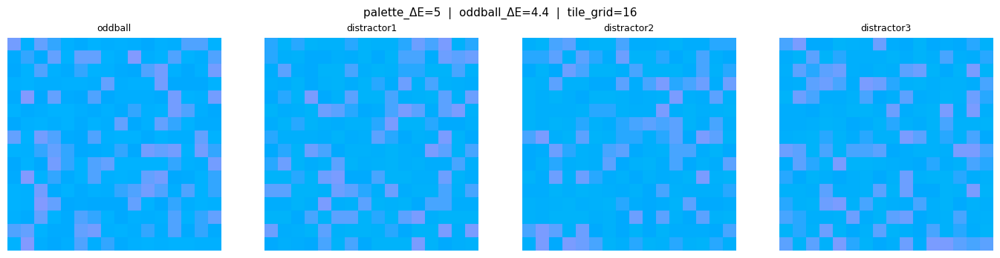

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L66.20641788534587_dist(-5.6730751973260718, -52.509925423574487)_odd(-2.259075987721515, -55.230609310400226)_pde5_tg16_seed42_*.png]


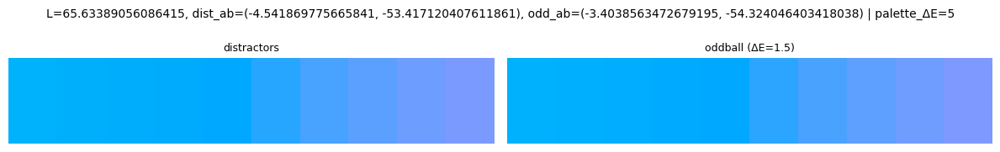

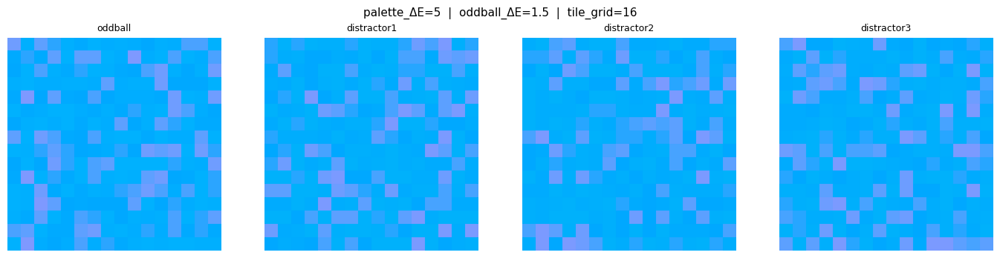

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L65.63389056086415_dist(-4.541869775665841, -53.417120407611861)_odd(-3.4038563472679195, -54.324046403418038)_pde5_tg16_seed42_*.png]


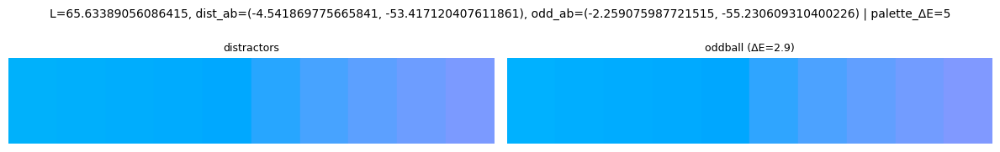

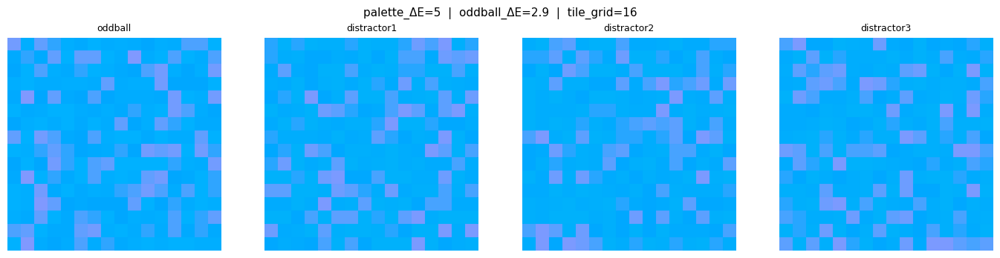

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L65.63389056086415_dist(-4.541869775665841, -53.417120407611861)_odd(-2.259075987721515, -55.230609310400226)_pde5_tg16_seed42_*.png]


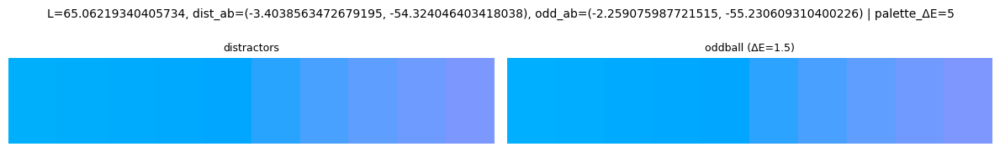

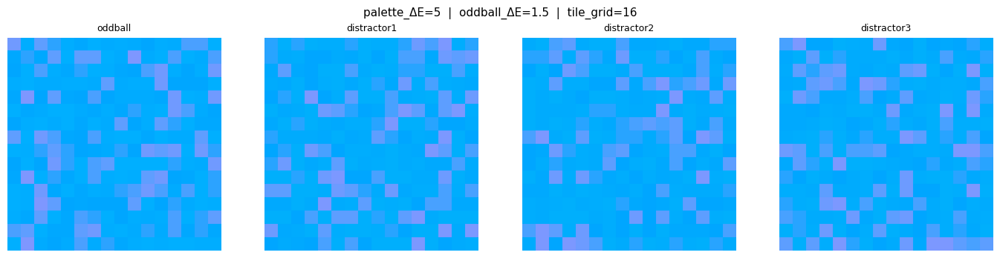

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L65.06219340405734_dist(-3.4038563472679195, -54.324046403418038)_odd(-2.259075987721515, -55.230609310400226)_pde5_tg16_seed42_*.png]


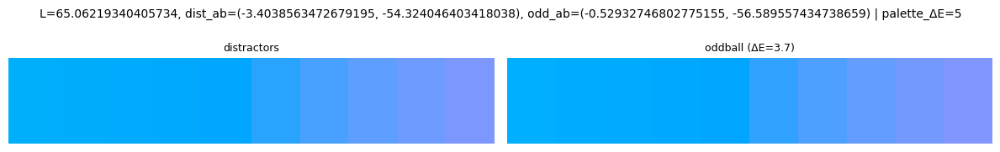

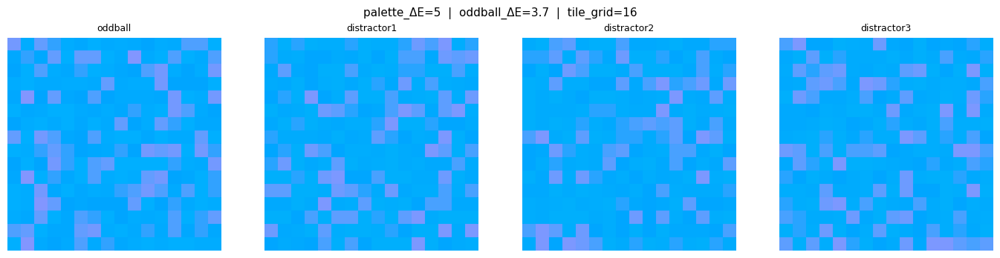

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L65.06219340405734_dist(-3.4038563472679195, -54.324046403418038)_odd(-0.52932746802775155, -56.589557434738659)_pde5_tg16_seed42_*.png]


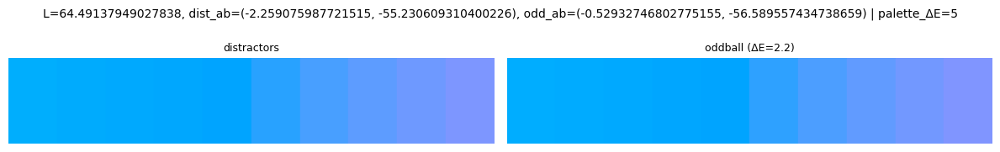

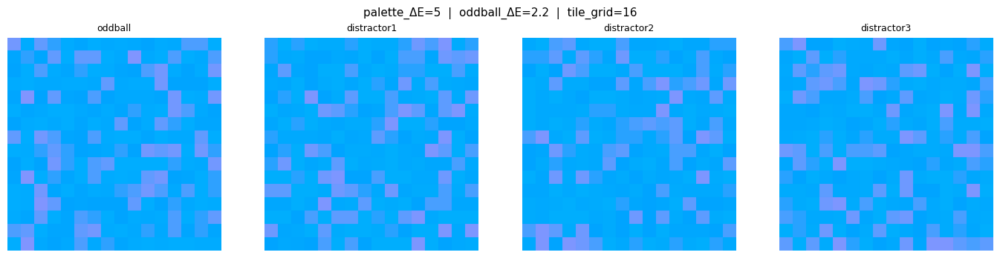

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L64.49137949027838_dist(-2.259075987721515, -55.230609310400226)_odd(-0.52932746802775155, -56.589557434738659)_pde5_tg16_seed42_*.png]


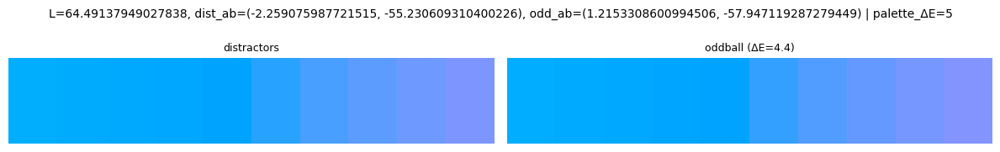

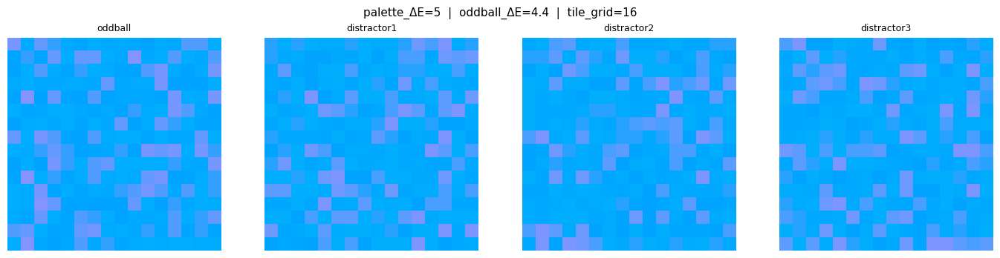

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L64.49137949027838_dist(-2.259075987721515, -55.230609310400226)_odd(1.2153308600994506, -57.947119287279449)_pde5_tg16_seed42_*.png]


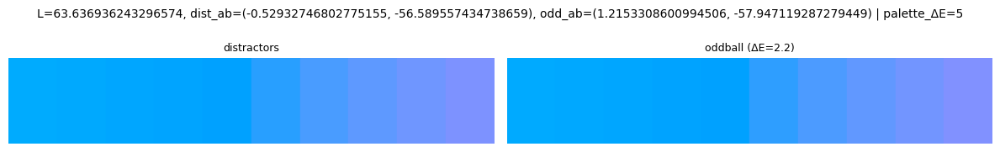

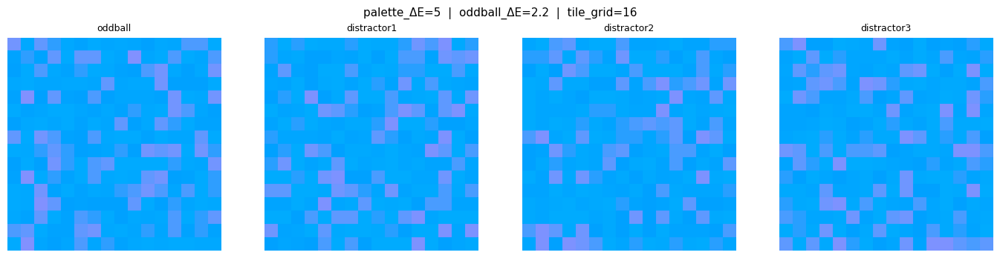

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L63.636936243296574_dist(-0.52932746802775155, -56.589557434738659)_odd(1.2153308600994506, -57.947119287279449)_pde5_tg16_seed42_*.png]


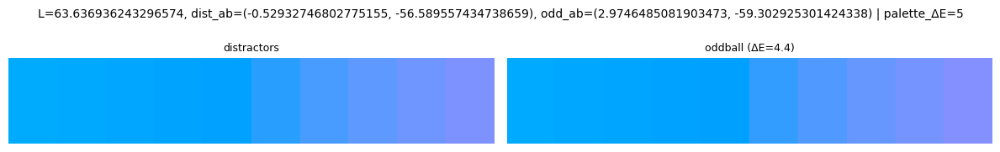

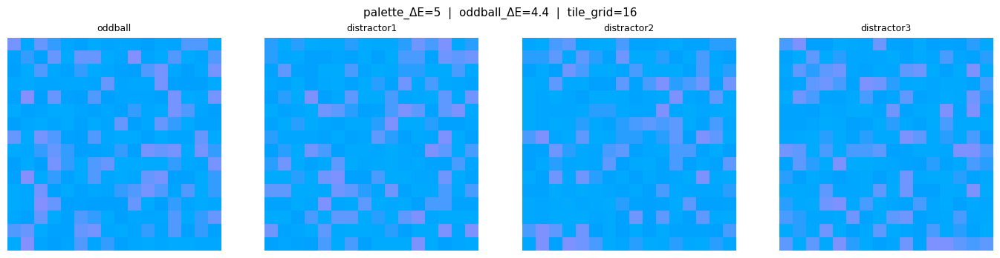

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L63.636936243296574_dist(-0.52932746802775155, -56.589557434738659)_odd(2.9746485081903473, -59.302925301424338)_pde5_tg16_seed42_*.png]


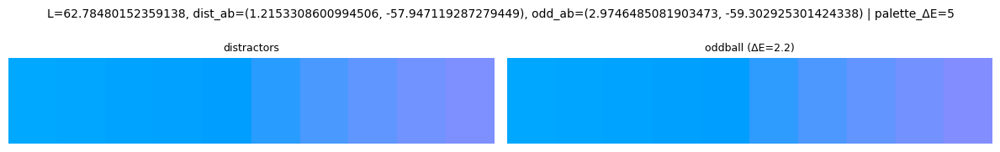

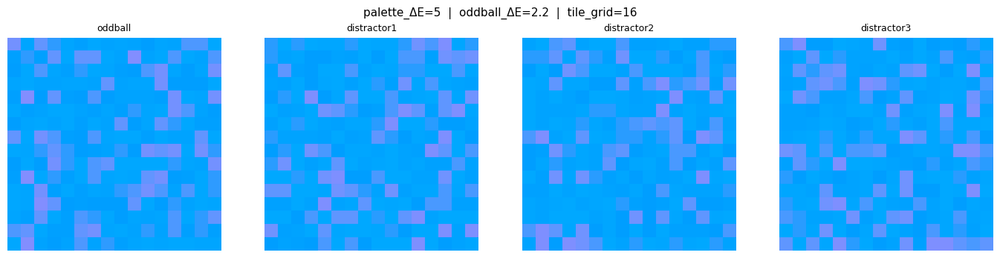

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L62.78480152359138_dist(1.2153308600994506, -57.947119287279449)_odd(2.9746485081903473, -59.302925301424338)_pde5_tg16_seed42_*.png]


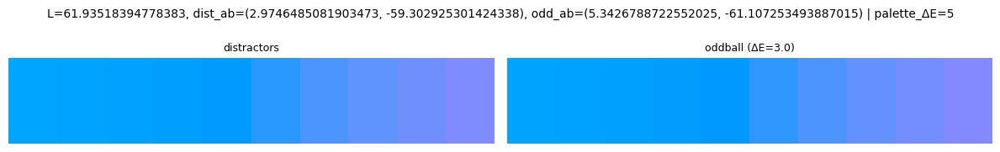

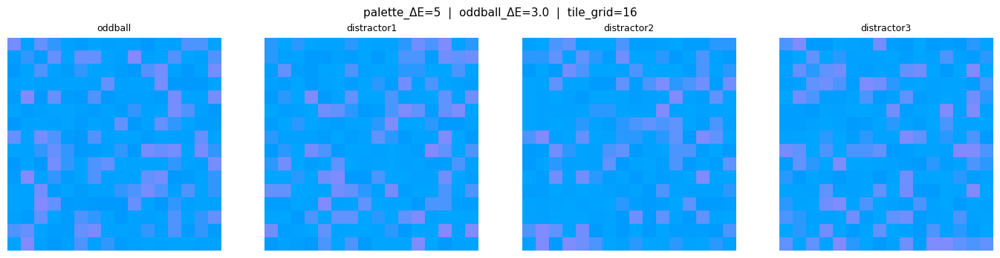

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L61.93518394778383_dist(2.9746485081903473, -59.302925301424338)_odd(5.3426788722552025, -61.107253493887015)_pde5_tg16_seed42_*.png]


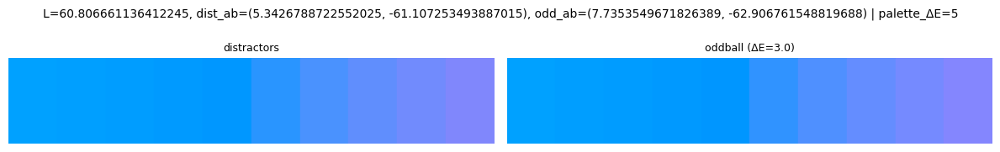

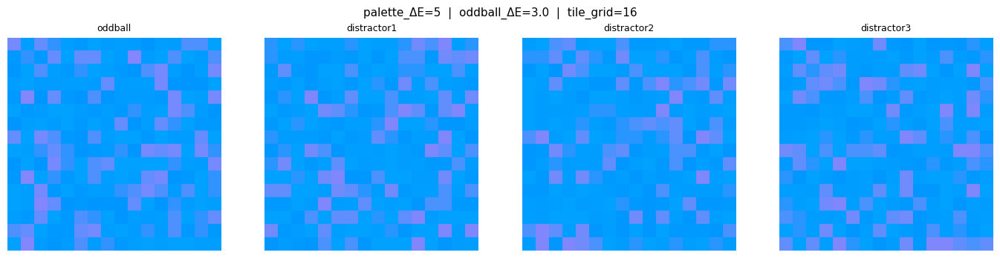

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L60.806661136412245_dist(5.3426788722552025, -61.107253493887015)_odd(7.7353549671826389, -62.906761548819688)_pde5_tg16_seed42_*.png]


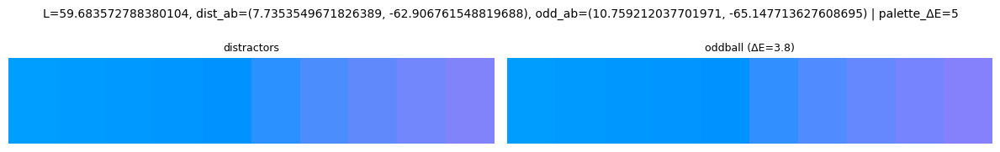

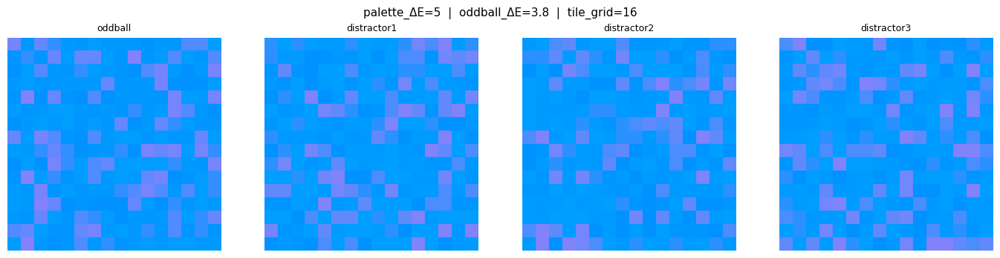

Saved to /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/pngs_L60_tg16_minDE_1_maxDE_5/  [L59.683572788380104_dist(7.7353549671826389, -62.906761548819688)_odd(10.759212037701971, -65.147713627608695)_pde5_tg16_seed42_*.png]
Saved → /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/trial_gallery_L60_tg16_minDE_1_maxDE_5.html


In [ ]:
# ── HTML + PNG export — 16×16 grid ───────────────────────────────────────────

ring  = generate_hue_ring(L=60, C=80, n_colors=72, offset_deg=0)
pairs = select_pairs(ring, min_de=1, max_de=5)#CHANGED FROM min_de 5 to 2 and max from 20 to 12
lab   = rgb2lab(ring.reshape(1, -1, 3).astype(np.float64) / 255.0)[0]

png_dir  = os.path.join(export_folder, "pngs_L60_tg12_minDE_1_maxDE_5")
html_out = os.path.join(export_folder, "trial_gallery_L60_tg12_minDE_1_maxDE_5.html")

trial_sets = []
for i, j in pairs:
    dist_ab = (lab[i, 1], lab[i, 2])
    odd_ab  = (lab[j, 1], lab[j, 2])
    de      = np.sqrt((dist_ab[0] - odd_ab[0])**2 + (dist_ab[1] - odd_ab[1])**2)

    bitmaps = make_trial_from_pair(
        L          = lab[i, 0],
        dist_ab    = dist_ab,
        odd_ab     = odd_ab,
        palette_de = 5,
        n_shades   = 10,
        seed       = 42,
        tile_grid  = 12,
        export_dir = png_dir,
    )
    trial_sets.append({
        "bitmaps": bitmaps,
        "title": f"dist=({dist_ab[0]:.1f}, {dist_ab[1]:.1f})  "
                 f"odd=({odd_ab[0]:.1f}, {odd_ab[1]:.1f})  ΔE={de:.1f}  grid=16×16"
    })

export_html(trial_sets, output_path=html_out)


In [18]:
def show_hue_ring(L, C, n_colors, offset_deg=0, export_dir="trial_exports"):
    ring = generate_hue_ring(L, C, n_colors, offset_deg)
    img = ring.reshape(1, n_colors, 3)

    fig, ax = plt.subplots(figsize=(n_colors * 0.6, 1.5))
    ax.imshow(img, aspect='auto')
    ax.axis('off')
    ax.set_title(f"Hue ring — L={L}, C={C}, n={n_colors}, offset={offset_deg}°", fontsize=10)
    plt.tight_layout()

    os.makedirs(export_dir, exist_ok=True)
    path = os.path.join(export_dir, f"hue_ring_L{L}_C{C}_n{n_colors}_offset{offset_deg}.png")
    plt.savefig(path, dpi=150, bbox_inches='tight')
    plt.close(fig)
    print(f"Saved → {path}")

    return ring

show_hue_ring(L=40, C=80, n_colors=72, offset_deg=0, export_dir=export_folder)


Saved → /Users/momueller/Dropbox (Personal)/Vandy/Projects/SceneFactor_OPLab/Melina/bitmap_trials/hue_ring_L40_C80_n72_offset0.png


array([[201,   0,  97],
       [202,   0,  87],
       [203,   0,  76],
       [203,   0,  65],
       [201,   0,  55],
       [199,   0,  44],
       [196,   0,  34],
       [193,   0,  22],
       [188,  21,   7],
       [183,  35,   0],
       [178,  45,   0],
       [172,  54,   0],
       [165,  61,   0],
       [158,  68,   0],
       [151,  74,   0],
       [143,  79,   0],
       [135,  84,   0],
       [126,  88,   0],
       [117,  92,   0],
       [107,  96,   0],
       [ 97,  99,   0],
       [ 87, 102,   0],
       [ 75, 104,   0],
       [ 62, 106,   0],
       [ 47, 108,   0],
       [ 25, 110,   0],
       [  0, 112,   0],
       [  0, 113,   0],
       [  0, 114,   0],
       [  0, 115,   0],
       [  0, 116,  16],
       [  0, 117,  32],
       [  0, 117,  45],
       [  0, 118,  58],
       [  0, 118,  69],
       [  0, 119,  81],
       [  0, 119,  93],
       [  0, 120, 104],
       [  0, 120, 115],
       [  0, 120, 127],
       [  0, 120, 138],
       [  0, 120